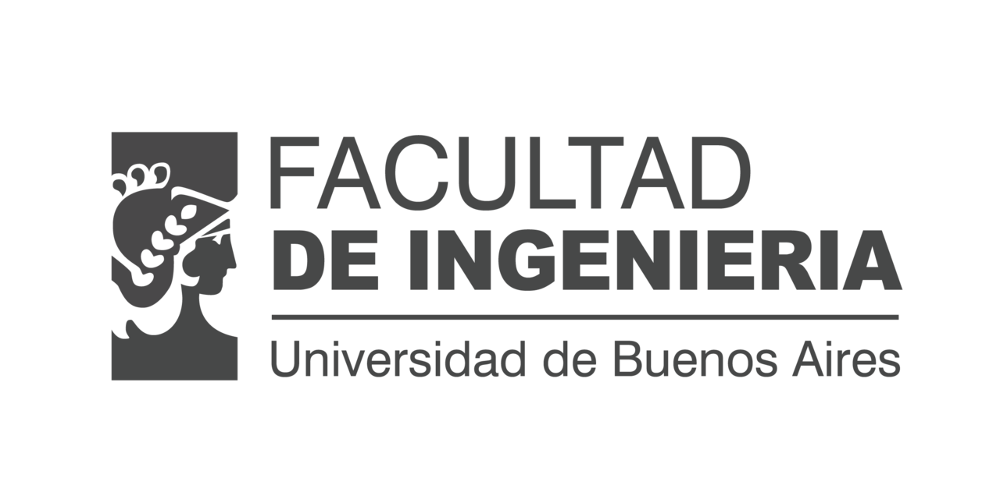

**Profesores:** <br />
Dr. Facundo Adrián Lucianna - facundolucianna@gmail.com <br />
Dr. Álvaro Gabriel Pizá - piza.ag@gmail.com <br />

**Alumnos:** <br />
Ing. Pablo Martin Gomez Verdini - gomezpablo86@gmail.com <br />
Ing. Diego Paciotti Iacchelli - diegopaciotti@gmail.com  <br />
Ing. Joaquin Gonzalez - joagonzalez@gmail.com <br />

**Repositorio Github**<br />
https://github.com/FIUBA-CEIA-18Co2024/AMIA-TP3 <br />


## Table of Contents
1. [SVM y CatBoost para clasificación de reviews de TripAdvisor - Busqueda de hiperparámetros](#svm-y-catboost-para-clasificación-de-reviews-de-tripadvisor---busqueda-de-hiperparámetros)
    1. [Definiciones](#definiciones)
    2. [Datos para 5 clases](#datos-para-5-clases)
        1. [Visualización con t-SNE](#visualización-con-t-sne)
        2. [Busqueda de hiperparametros con Optuna](#busqueda-de-hiperparametros-con-optuna)
            1. [LinearSVC (liblinear) para 5 clases](#linearsvc-liblinear-para-5-clases)
            2. [SVC kernel linear (LibSVM) para 5 clases](#svc-kernel-linear-libsvm-para-5-clases)
            3. [SVC kernel rbf (LibSVM) para 5 clases](#svc-kernel-rbf-libsvm-para-5-clases)
            4. [Catboost para 5 clases (GPU)](#catboost-para-5-clases-gpu)
    3. [Datos para 3 clases](#datos-para-3-clases)
        1. [Visualización con t-SNE](#visualización-con-t-sne-1)
        2. [Busqueda de hiperparametros con Optuna](#busqueda-de-hiperparametros-con-optuna-1)
            1. [LinearSVC (liblinear) para 3 clases](#linearsvc-liblinear-para-3-clases)
            2. [SVC kernel linear (LibSVM) para 3 clases](#svc-kernel-linear-libsvm-para-3-clases)
            3. [SVC kernel rbf (LibSVM) para 3 clases](#svc-kernel-rbf-libsvm-para-3-clases)
            4. [Catboost para 3 clases (GPU)](#catboost-para-3-clases-gpu)

# SVM y CatBoost para clasificación de reviews de TripAdvisor - Busqueda de hiperparámetros

## Definiciones

In [2]:
from utils import *

In [ ]:
# Distribución de los hiperparámetros para cada modelo
param_distributions = {
    "linear_svc": {     #liblinear
        "classifier": {
            "C": ("suggest_float", (0.01, 0.1, 0.001)),
        },
    },
    "svc_rbf": {        #libsvm
        "dim_reduction": {
            "n_components": ("suggest_int", (1000, 1000, 1000))},
        "classifier": {
            "C": ("suggest_float", (1.1, 1.8, 0.01)), #"C": ("suggest_float", (30, 40, 1)),    
            "gamma": ("suggest_float", (0.01, 0.04, 0.01)) 
        },
    },
    "svc_linear": {     #libsvm
        "classifier": {
            "C": ("suggest_float", (0.02, 0.32, 0.05)),
        },
    },
    "catboost": {
        "dim_reduction": {
            "n_components" : ("suggest_int", (1000, 2000, 250))},
        "classifier": {
            "iterations": ("suggest_int", (500, 2500, 500)),
            "depth": ("suggest_int", (3, 10, 1))
        },
    },
}

## Datos para 5 clases

In [4]:
df = pd.read_csv("data/cleaned_dataset_processed_balanced.csv", encoding='utf-8')
X = df['cleaned_review']
y = df['rating']
random_state = 42
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=random_state, stratify=y)

### Visualización con t-SNE

(20508, 31503)

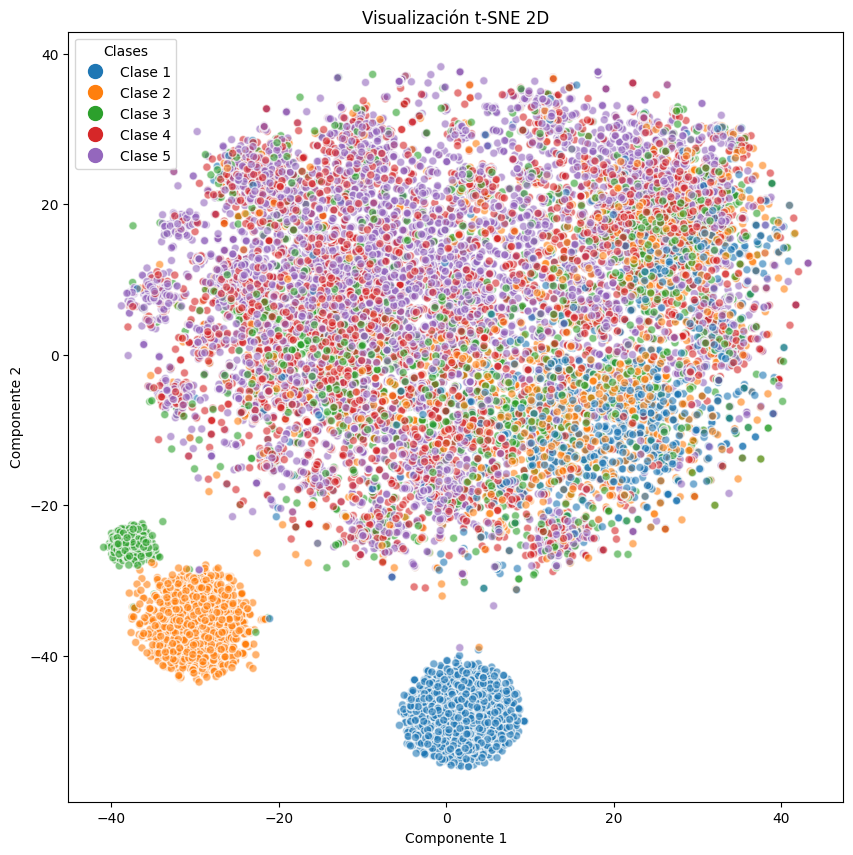

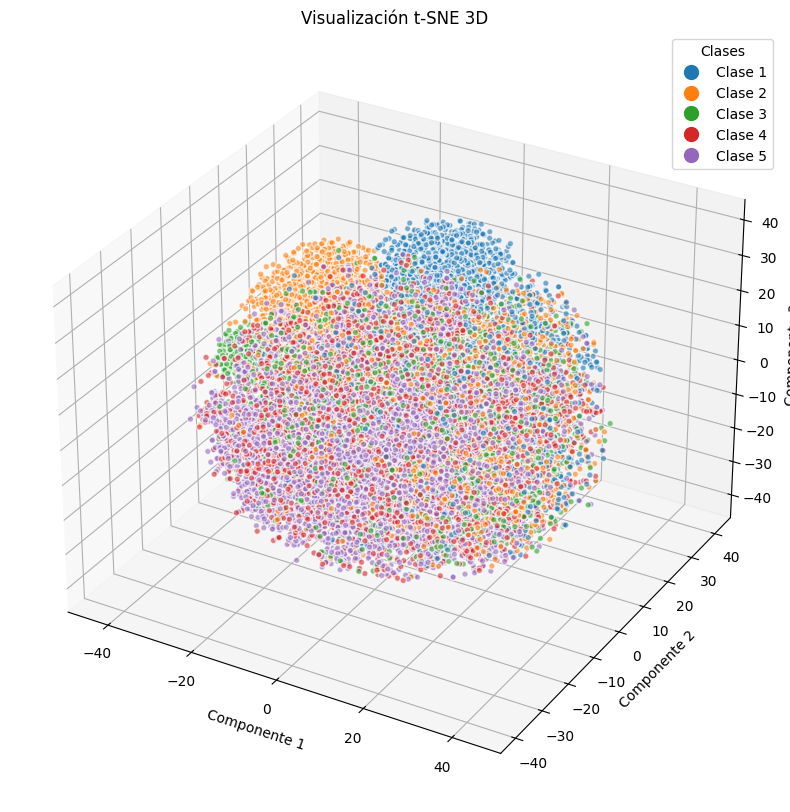

In [5]:
TSNE_GPU = False
# Para uso en GPU
if TSNE_GPU:
    from cuml import TSNE
else:
    from sklearn.manifold import TSNE

# Vectorizar los textos (TF-IDF)
vectorizer = TfidfVectorizer(min_df=10, max_df=0.9, ngram_range=(1, 2))
X_tfidf = vectorizer.fit_transform(X)
X_dense = X_tfidf.toarray()
display(X_dense.shape)

# Visualizar en 2D
tsne_2d = TSNE(n_components=2, perplexity=100, random_state=random_state, learning_rate=200, init='random') 
X_tsne_2d = tsne_2d.fit_transform(X_dense)
plot_tsne(X_tsne_2d, y, title="Visualización t-SNE 2D")
# Visualizar en 3D (no soportada en cuML)
if TSNE_GPU == False:
    tsne_3d = TSNE(n_components=3, perplexity=100, random_state=random_state, learning_rate=200, init='random') 
    X_tsne_3d = tsne_3d.fit_transform(X_dense)
    plot_tsne(X_tsne_3d, y, title="Visualización t-SNE 3D")

### Busqueda de hiperparametros con Optuna

##### LinearSVC (liblinear) para 5 clases

In [ ]:
%%time
study = "linear_svc"
optuna_db = create_db(study)
study_linear_svc = optuna.create_study(direction="maximize", study_name=study, storage=optuna_db, load_if_exists=True)
study_linear_svc.optimize(lambda trial: objective(trial, pipeline_steps[study], param_distributions[study], X_train, y_train), n_trials=100, n_jobs=-1)

[I 2024-12-08 20:00:39,558] Using an existing study with name 'linear_svc' instead of creating a new one.
[I 2024-12-08 20:00:47,475] Trial 104 finished with value: 0.8435388366422849 and parameters: {'C': 0.015}. Best is trial 104 with value: 0.8435388366422849.
[I 2024-12-08 20:00:47,697] Trial 109 finished with value: 0.8435388366422849 and parameters: {'C': 0.015}. Best is trial 104 with value: 0.8435388366422849.
[I 2024-12-08 20:00:47,806] Trial 101 finished with value: 0.8435388366422849 and parameters: {'C': 0.015}. Best is trial 101 with value: 0.8435388366422849.
[I 2024-12-08 20:00:47,959] Trial 110 finished with value: 0.8435388366422849 and parameters: {'C': 0.09899999999999999}. Best is trial 101 with value: 0.8435388366422849.
[I 2024-12-08 20:00:48,361] Trial 105 finished with value: 0.8435388366422849 and parameters: {'C': 0.015}. Best is trial 101 with value: 0.8435388366422849.
[I 2024-12-08 20:00:51,844] Trial 111 finished with value: 0.8435388366422849 and paramete

##### SVC kernel linear (LibSVM) para 5 clases

In [ ]:

study = "svc_linear"
optuna_db = create_db(study)
study_svc_linear = optuna.create_study(direction="maximize", study_name=study, storage=optuna_db, load_if_exists=True)
study_svc_linear.optimize(lambda trial: objective(trial, pipeline_steps[study], param_distributions[study], X_train, y_train, n_jobs=1), n_trials=50, n_jobs=-1)

[I 2024-11-26 22:26:05,154] Using an existing study with name 'svc_linear' instead of creating a new one.


[Pipeline] ........ (step 1 of 3) Processing vectorizer, total=   3.2s
[Pipeline] ........ (step 1 of 3) Processing vectorizer, total=   4.1s
[Pipeline] ............ (step 2 of 3) Processing scaler, total=   2.3s
[Pipeline] ............ (step 2 of 3) Processing scaler, total=   2.0s
[Pipeline] ........ (step 1 of 3) Processing vectorizer, total=   5.6s
[Pipeline] ........ (step 1 of 3) Processing vectorizer, total=   4.8s
[Pipeline] ............ (step 2 of 3) Processing scaler, total=   1.0s
[Pipeline] ........ (step 1 of 3) Processing vectorizer, total=   4.8s
[Pipeline] ............ (step 2 of 3) Processing scaler, total=   1.1s
[Pipeline] ............ (step 2 of 3) Processing scaler, total=   1.8s
[Pipeline] ........ (step 1 of 3) Processing vectorizer, total=   4.5s
[Pipeline] ............ (step 2 of 3) Processing scaler, total=   1.3s
[Pipeline] ........ (step 1 of 3) Processing vectorizer, total=   4.2s
[Pipeline] ............ (step 2 of 3) Processing scaler, total=   0.8s
[Pipel

[I 2024-11-26 22:44:19,251] Trial 60 finished with value: 0.640264716126785 and parameters: {'C': 0.08}. Best is trial 24 with value: 0.6483455242075932.


[Pipeline] ........ (step 1 of 3) Processing vectorizer, total=   4.0s
[Pipeline] ............ (step 2 of 3) Processing scaler, total=   0.0s
[Pipeline] ........ (step 3 of 3) Processing classifier, total= 5.6min


[I 2024-11-26 22:44:29,354] Trial 54 finished with value: 0.640264716126785 and parameters: {'C': 0.08}. Best is trial 24 with value: 0.6483455242075932.


[Pipeline] ........ (step 1 of 3) Processing vectorizer, total=   4.0s
[Pipeline] ............ (step 2 of 3) Processing scaler, total=   0.0s
[Pipeline] ........ (step 3 of 3) Processing classifier, total= 5.6min
[Pipeline] ........ (step 3 of 3) Processing classifier, total= 5.6min
[Pipeline] ........ (step 3 of 3) Processing classifier, total= 5.6min


[I 2024-11-26 22:44:54,871] Trial 56 finished with value: 0.6391501219087427 and parameters: {'C': 0.13}. Best is trial 24 with value: 0.6483455242075932.


[Pipeline] ........ (step 1 of 3) Processing vectorizer, total=   3.9s
[Pipeline] ............ (step 2 of 3) Processing scaler, total=   0.0s
[Pipeline] ........ (step 3 of 3) Processing classifier, total= 5.6min


[I 2024-11-26 22:45:09,113] Trial 57 finished with value: 0.640264716126785 and parameters: {'C': 0.08}. Best is trial 24 with value: 0.6483455242075932.


[Pipeline] ........ (step 3 of 3) Processing classifier, total= 5.7min
[Pipeline] ........ (step 3 of 3) Processing classifier, total= 5.8min
[Pipeline] ........ (step 3 of 3) Processing classifier, total= 5.8min[Pipeline] ........ (step 3 of 3) Processing classifier, total= 5.8min



[I 2024-11-26 22:45:15,904] Trial 53 finished with value: 0.640264716126785 and parameters: {'C': 0.08}. Best is trial 24 with value: 0.6483455242075932.


[Pipeline] ........ (step 1 of 3) Processing vectorizer, total=   6.6s
[Pipeline] ............ (step 2 of 3) Processing scaler, total=   0.0s


[I 2024-11-26 22:45:17,403] Trial 66 finished with value: 0.640264716126785 and parameters: {'C': 0.08}. Best is trial 24 with value: 0.6483455242075932.


[Pipeline] ........ (step 1 of 3) Processing vectorizer, total=   5.4s
[Pipeline] ............ (step 2 of 3) Processing scaler, total=   0.3s
[Pipeline] ........ (step 1 of 3) Processing vectorizer, total=   5.7s
[Pipeline] ............ (step 2 of 3) Processing scaler, total=   0.0s


[I 2024-11-26 22:45:27,295] Trial 64 finished with value: 0.640264716126785 and parameters: {'C': 0.08}. Best is trial 24 with value: 0.6483455242075932.


[Pipeline] ........ (step 1 of 3) Processing vectorizer, total=   3.8s
[Pipeline] ............ (step 2 of 3) Processing scaler, total=   0.0s


[I 2024-11-26 22:45:41,407] Trial 55 finished with value: 0.640264716126785 and parameters: {'C': 0.08}. Best is trial 24 with value: 0.6483455242075932.
[I 2024-11-26 22:45:42,758] Trial 58 finished with value: 0.640264716126785 and parameters: {'C': 0.08}. Best is trial 24 with value: 0.6483455242075932.
[I 2024-11-26 22:45:46,954] Trial 59 finished with value: 0.640264716126785 and parameters: {'C': 0.08}. Best is trial 24 with value: 0.6483455242075932.


[Pipeline] ........ (step 1 of 3) Processing vectorizer, total=   5.3s


[I 2024-11-26 22:45:47,097] Trial 62 finished with value: 0.640264716126785 and parameters: {'C': 0.08}. Best is trial 24 with value: 0.6483455242075932.


[Pipeline] ............ (step 2 of 3) Processing scaler, total=   0.3s
[Pipeline] ........ (step 1 of 3) Processing vectorizer, total=   6.4s
[Pipeline] ........ (step 3 of 3) Processing classifier, total= 5.8min
[Pipeline] ........ (step 3 of 3) Processing classifier, total= 5.8min
[Pipeline] ........ (step 3 of 3) Processing classifier, total= 5.8min
[Pipeline] ............ (step 2 of 3) Processing scaler, total=   2.2s
[Pipeline] ........ (step 1 of 3) Processing vectorizer, total=   8.8s
[Pipeline] ............ (step 2 of 3) Processing scaler, total=   0.1s
[Pipeline] ........ (step 1 of 3) Processing vectorizer, total=   8.0s
[Pipeline] ............ (step 2 of 3) Processing scaler, total=   0.0s


[I 2024-11-26 22:46:21,558] Trial 68 finished with value: 0.640264716126785 and parameters: {'C': 0.08}. Best is trial 24 with value: 0.6483455242075932.
[I 2024-11-26 22:46:23,137] Trial 69 finished with value: 0.640264716126785 and parameters: {'C': 0.08}. Best is trial 24 with value: 0.6483455242075932.
[I 2024-11-26 22:46:27,060] Trial 65 finished with value: 0.640264716126785 and parameters: {'C': 0.08}. Best is trial 24 with value: 0.6483455242075932.


[Pipeline] ........ (step 1 of 3) Processing vectorizer, total=   5.5s
[Pipeline] ............ (step 2 of 3) Processing scaler, total=   0.4s
[Pipeline] ........ (step 1 of 3) Processing vectorizer, total=   6.8s
[Pipeline] ............ (step 2 of 3) Processing scaler, total=   0.3s
[Pipeline] ........ (step 1 of 3) Processing vectorizer, total=   5.7s
[Pipeline] ............ (step 2 of 3) Processing scaler, total=   0.0s
[Pipeline] ........ (step 3 of 3) Processing classifier, total= 6.4min
[Pipeline] ........ (step 3 of 3) Processing classifier, total= 6.5min
[Pipeline] ........ (step 3 of 3) Processing classifier, total= 6.5min
[Pipeline] ........ (step 3 of 3) Processing classifier, total= 6.5min
[Pipeline] ........ (step 3 of 3) Processing classifier, total= 6.5min
[Pipeline] ........ (step 3 of 3) Processing classifier, total= 6.5min


[I 2024-11-26 22:47:52,134] Trial 67 finished with value: 0.640264716126785 and parameters: {'C': 0.08}. Best is trial 24 with value: 0.6483455242075932.
[I 2024-11-26 22:47:53,671] Trial 51 finished with value: 0.640264716126785 and parameters: {'C': 0.08}. Best is trial 24 with value: 0.6483455242075932.
[I 2024-11-26 22:47:55,214] Trial 50 finished with value: 0.640264716126785 and parameters: {'C': 0.08}. Best is trial 24 with value: 0.6483455242075932.
[I 2024-11-26 22:47:55,672] Trial 61 finished with value: 0.640264716126785 and parameters: {'C': 0.08}. Best is trial 24 with value: 0.6483455242075932.


[Pipeline] ........ (step 1 of 3) Processing vectorizer, total=   5.0s
[Pipeline] ............ (step 2 of 3) Processing scaler, total=   0.9s


[I 2024-11-26 22:48:00,958] Trial 63 finished with value: 0.640264716126785 and parameters: {'C': 0.08}. Best is trial 24 with value: 0.6483455242075932.


[Pipeline] ........ (step 1 of 3) Processing vectorizer, total=   5.3s
[Pipeline] ............ (step 2 of 3) Processing scaler, total=   0.4s


[I 2024-11-26 22:48:02,857] Trial 52 finished with value: 0.640264716126785 and parameters: {'C': 0.08}. Best is trial 24 with value: 0.6483455242075932.


[Pipeline] ........ (step 1 of 3) Processing vectorizer, total=   6.4s
[Pipeline] ............ (step 2 of 3) Processing scaler, total=   0.5s
[Pipeline] ........ (step 1 of 3) Processing vectorizer, total=   5.9s
[Pipeline] ............ (step 2 of 3) Processing scaler, total=   2.0s
[Pipeline] ........ (step 1 of 3) Processing vectorizer, total=   7.4s
[Pipeline] ............ (step 2 of 3) Processing scaler, total=   0.9s
[Pipeline] ........ (step 1 of 3) Processing vectorizer, total=   6.2s
[Pipeline] ............ (step 2 of 3) Processing scaler, total=   0.0s
[Pipeline] ........ (step 3 of 3) Processing classifier, total= 5.7min
[Pipeline] ........ (step 3 of 3) Processing classifier, total= 5.6min
[Pipeline] ........ (step 3 of 3) Processing classifier, total= 5.6min


C:\Users\Pablo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[Pipeline] ........ (step 3 of 3) Processing classifier, total= 5.4min
[Pipeline] ........ (step 1 of 3) Processing vectorizer, total=   7.8s
[Pipeline] ............ (step 2 of 3) Processing scaler, total=   0.3s
[Pipeline] ........ (step 1 of 3) Processing vectorizer, total=   7.5s
[Pipeline] ............ (step 2 of 3) Processing scaler, total=   0.0s


##### SVC kernel rbf (LibSVM) para 5 clases

In [11]:
%%time
study = "svc_rbf"
optuna_db = create_db(study)
study_svc_rbf = optuna.create_study(direction="maximize", study_name=study, storage=optuna_db, load_if_exists=True)
study_svc_rbf.optimize(lambda trial: objective(trial, pipeline_steps[study], param_distributions[study], X_train, y_train, n_jobs=8), n_trials=25, n_jobs=1, timeout=7200)

[I 2024-11-28 22:32:35,908] A new study created in RDB with name: svc_rbf
C:\Users\Pablo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\optuna\study\_optimize.py:186: ExperimentalWarning: fail_stale_trials is experimental (supported from v2.9.0). The interface can change in the future.
  optuna.storages.fail_stale_trials(study)
[I 2024-11-28 22:44:09,038] Trial 0 finished with value: 0.6075931731104145 and parameters: {'n_components': 1000, 'C': 1.35, 'gamma': 0.04}. Best is trial 0 with value: 0.6075931731104145.
C:\Users\Pablo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\optuna\study\_optimize.py:186: ExperimentalWarning: fail_stale_trials is experimental (supported from v2.9.0). The interface can change in the future.
  optuna.storages.fail_stale_trials(study)
[I 2024-11-28 22:50:18,857] Trial 1 finished with value: 0.61546499477

CPU times: total: 3.34 s
Wall time: 2h 2min 26s


##### Catboost para 5 clases (GPU)

In [ ]:
%%time
study = "catboost"
optuna_db = create_db(study)
study_catboost = optuna.create_study(direction="maximize", study_name=study, storage=optuna_db, load_if_exists=True)
study_catboost.optimize(lambda trial: objective(trial, pipeline_steps[study], param_distributions[study], X_train, y_train, n_jobs=1), n_trials=25, n_jobs=1)

[I 2024-11-26 22:05:27,738] Using an existing study with name 'catboost' instead of creating a new one.


[Pipeline] ........ (step 1 of 4) Processing vectorizer, total=   1.1s
[Pipeline] ..... (step 2 of 4) Processing dim_reduction, total=  21.7s
[Pipeline] ............ (step 3 of 4) Processing scaler, total=   0.1s
0:	learn: 1.5874698	total: 247ms	remaining: 7m 49s
1:	learn: 1.5635794	total: 437ms	remaining: 6m 54s
2:	learn: 1.5402180	total: 616ms	remaining: 6m 29s
3:	learn: 1.5181086	total: 804ms	remaining: 6m 20s
4:	learn: 1.4989560	total: 1.02s	remaining: 6m 28s
5:	learn: 1.4789299	total: 1.22s	remaining: 6m 23s
6:	learn: 1.4641260	total: 1.47s	remaining: 6m 38s
7:	learn: 1.4464261	total: 1.68s	remaining: 6m 36s
8:	learn: 1.4314606	total: 1.91s	remaining: 6m 41s
9:	learn: 1.4143679	total: 2.1s	remaining: 6m 36s
10:	learn: 1.3985604	total: 2.31s	remaining: 6m 37s
11:	learn: 1.3829945	total: 2.5s	remaining: 6m 33s
12:	learn: 1.3683715	total: 2.7s	remaining: 6m 32s
13:	learn: 1.3549133	total: 2.93s	remaining: 6m 34s
14:	learn: 1.3421529	total: 3.14s	remaining: 6m 34s
15:	learn: 1.3289496

KeyboardInterrupt: 

Exception ignored in: '_catboost._WriteLog'
Traceback (most recent call last):
  File "C:\Users\Pablo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\ipykernel\iostream.py", line 655, in write
    def write(self, string: str) -> Optional[int]:  # type:ignore[override]

KeyboardInterrupt: 


67:	learn: 0.9851562	total: 14.6s	remaining: 6m 32s
68:	learn: 0.9807951	total: 14.8s	remaining: 6m 32s
69:	learn: 0.9768355	total: 15s	remaining: 6m 32s
70:	learn: 0.9729198	total: 15.3s	remaining: 6m 33s
71:	learn: 0.9690089	total: 15.5s	remaining: 6m 32s
72:	learn: 0.9652009	total: 15.7s	remaining: 6m 33s
73:	learn: 0.9613934	total: 15.9s	remaining: 6m 32s
74:	learn: 0.9576520	total: 16.1s	remaining: 6m 31s
75:	learn: 0.9539508	total: 16.3s	remaining: 6m 32s
76:	learn: 0.9500007	total: 16.5s	remaining: 6m 31s
77:	learn: 0.9462097	total: 16.7s	remaining: 6m 30s
78:	learn: 0.9426507	total: 16.9s	remaining: 6m 30s
79:	learn: 0.9390178	total: 17.1s	remaining: 6m 29s
80:	learn: 0.9354785	total: 17.3s	remaining: 6m 28s
81:	learn: 0.9321586	total: 17.5s	remaining: 6m 28s
82:	learn: 0.9289269	total: 17.8s	remaining: 6m 29s
83:	learn: 0.9256455	total: 18s	remaining: 6m 29s
84:	learn: 0.9223777	total: 18.2s	remaining: 6m 28s
85:	learn: 0.9189161	total: 18.4s	remaining: 6m 28s
86:	learn: 0.915

## Datos para 3 clases

In [ ]:
df = pd.read_csv("data/cleaned_dataset_processed_balanced.csv", encoding='utf-8')
X = df['cleaned_review']
y = df['three_classes']
random_state = 42
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=random_state, stratify=y)

### Visualización con t-SNE

(20508, 31503)

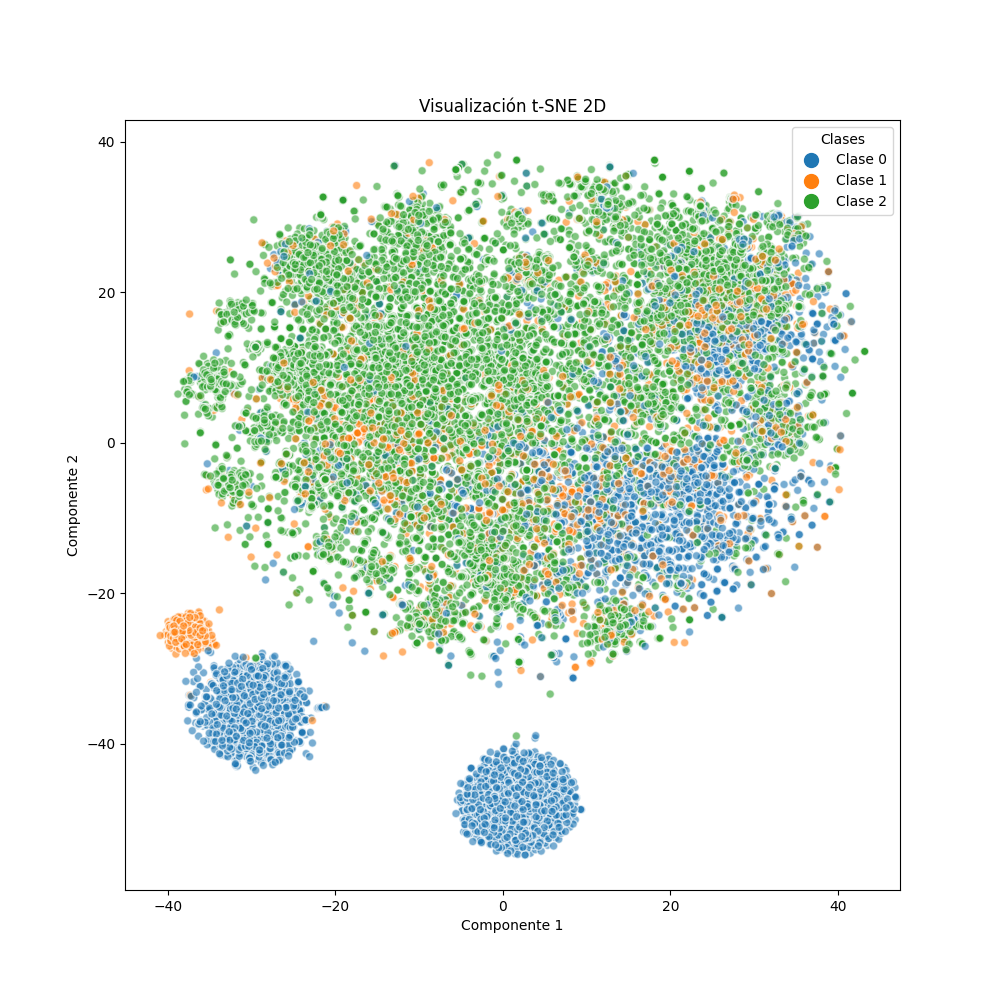

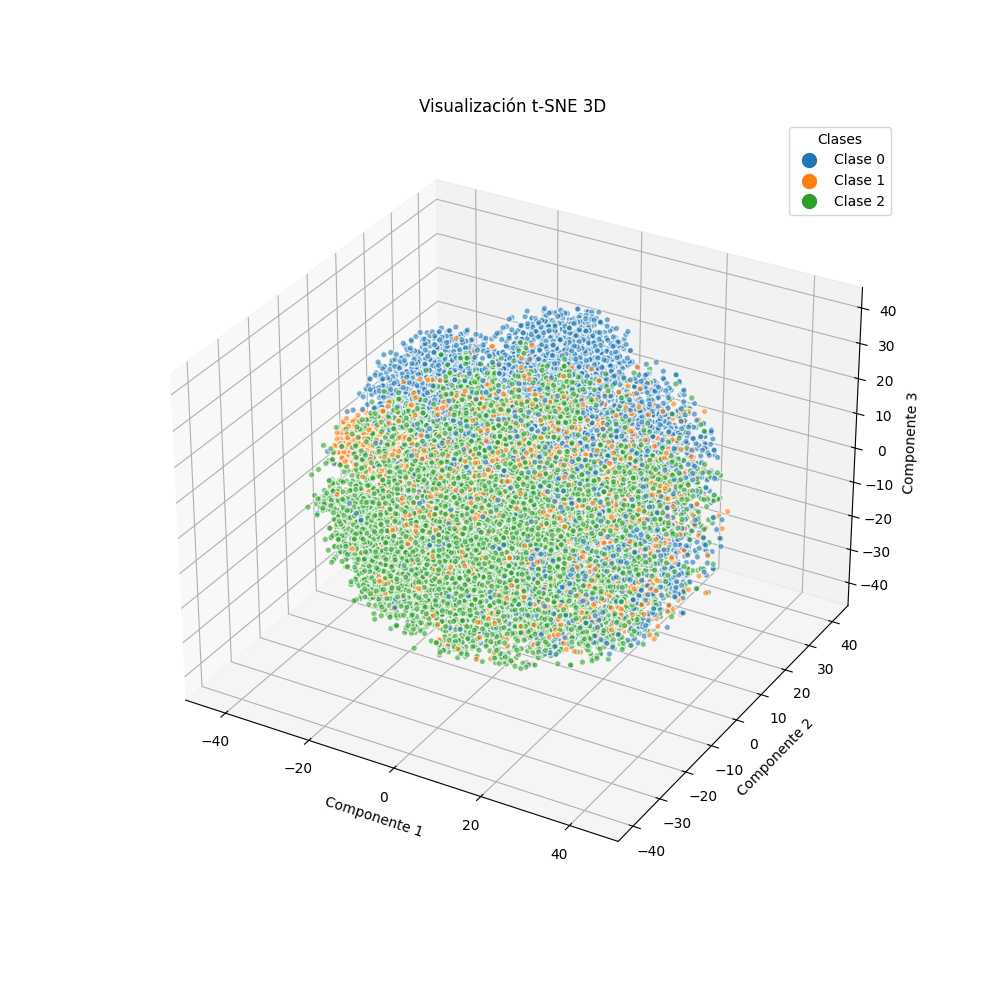

In [25]:
TSNE_GPU = False
# Para uso en GPU
if TSNE_GPU:
    from cuml import TSNE
else:
    from sklearn.manifold import TSNE

# Vectorizar los textos (TF-IDF)
vectorizer = TfidfVectorizer(min_df=10, max_df=0.9, ngram_range=(1, 2))
X_tfidf = vectorizer.fit_transform(X)
X_dense = X_tfidf.toarray()
display(X_dense.shape)

# Visualizar en 2D
tsne_2d = TSNE(n_components=2, perplexity=100, random_state=random_state, learning_rate=200, init='random') 
X_tsne_2d = tsne_2d.fit_transform(X_dense)
plot_tsne(X_tsne_2d, y, title="Visualización t-SNE 2D")
# Visualizar en 3D (no soportada en cuML)
if TSNE_GPU == False:
    tsne_3d = TSNE(n_components=3, perplexity=100, random_state=random_state, learning_rate=200, init='random') 
    X_tsne_3d = tsne_3d.fit_transform(X_dense)
    plot_tsne(X_tsne_3d, y, title="Visualización t-SNE 3D")

### Busqueda de hiperparametros con Optuna

##### LinearSVC (liblinear) para 3 clases

In [12]:
%%time
study = "linear_svc"
optuna_db = create_db(study, 3)
study_linear_svc = optuna.create_study(direction="maximize", study_name=study, storage=optuna_db, load_if_exists=True)
study_linear_svc.optimize(lambda trial: objective(trial, pipeline_steps[study], param_distributions[study], X_train, y_train), n_trials=100, n_jobs=-1)

[I 2024-11-25 22:26:01,997] A new study created in RDB with name: linear_svc
C:\Users\Pablo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\optuna\study\_optimize.py:186: ExperimentalWarning: fail_stale_trials is experimental (supported from v2.9.0). The interface can change in the future.
  optuna.storages.fail_stale_trials(study)
[I 2024-11-25 22:26:05,647] Trial 1 finished with value: 0.8494601184256357 and parameters: {'C': 0.068}. Best is trial 1 with value: 0.8494601184256357.
C:\Users\Pablo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\optuna\study\_optimize.py:186: ExperimentalWarning: fail_stale_trials is experimental (supported from v2.9.0). The interface can change in the future.
  optuna.storages.fail_stale_trials(study)
[I 2024-11-25 22:26:05,988] Trial 9 finished with value: 0.8498084291187739 and parameters: {'C': 0.097

CPU times: total: 18.5 s
Wall time: 52.8 s


##### SVC kernel linear (LibSVM) para 3 clases

In [40]:
%%time
study = "svc_linear"
optuna_db = create_db(study, 3)
study_svc_linear = optuna.create_study(direction="maximize", study_name=study, storage=optuna_db, load_if_exists=True)
study_svc_linear.optimize(lambda trial: objective(trial, pipeline_steps[study], param_distributions[study], X_train, y_train, n_jobs=1), n_trials=50, n_jobs=-1)

[I 2024-11-27 00:47:52,021] A new study created in RDB with name: svc_linear
C:\Users\Pablo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\optuna\study\_optimize.py:186: ExperimentalWarning: fail_stale_trials is experimental (supported from v2.9.0). The interface can change in the future.
  optuna.storages.fail_stale_trials(study)


[Pipeline] ........ (step 1 of 3) Processing vectorizer, total=   3.2s
[Pipeline] ............ (step 2 of 3) Processing scaler, total=   1.9s
[Pipeline] ........ (step 1 of 3) Processing vectorizer, total=   5.2s
[Pipeline] ............ (step 2 of 3) Processing scaler, total=   1.4s
[Pipeline] ........ (step 1 of 3) Processing vectorizer, total=   4.5s
[Pipeline] ........ (step 1 of 3) Processing vectorizer, total=   5.7s
[Pipeline] ............ (step 2 of 3) Processing scaler, total=   0.9s
[Pipeline] ........ (step 1 of 3) Processing vectorizer, total=   3.4s
[Pipeline] ............ (step 2 of 3) Processing scaler, total=   2.0s
[Pipeline] ............ (step 2 of 3) Processing scaler, total=   1.5s
[Pipeline] ........ (step 1 of 3) Processing vectorizer, total=   3.2s
[Pipeline] ............ (step 2 of 3) Processing scaler, total=   1.4s
[Pipeline] ........ (step 1 of 3) Processing vectorizer, total=   4.4s
[Pipeline] ............ (step 2 of 3) Processing scaler, total=   1.5s
[Pipel

[I 2024-11-27 00:59:14,622] Trial 11 finished with value: 0.8385231626610937 and parameters: {'C': 0.22}. Best is trial 11 with value: 0.8385231626610937.
C:\Users\Pablo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\optuna\study\_optimize.py:186: ExperimentalWarning: fail_stale_trials is experimental (supported from v2.9.0). The interface can change in the future.
  optuna.storages.fail_stale_trials(study)


[Pipeline] ........ (step 1 of 3) Processing vectorizer, total=   4.0s
[Pipeline] ............ (step 2 of 3) Processing scaler, total=   0.0s
[Pipeline] ........ (step 3 of 3) Processing classifier, total= 3.5min
[Pipeline] ........ (step 3 of 3) Processing classifier, total= 3.4min
[Pipeline] ........ (step 3 of 3) Processing classifier, total= 3.5min
[Pipeline] ........ (step 3 of 3) Processing classifier, total= 3.5min
[Pipeline] ........ (step 3 of 3) Processing classifier, total= 3.4min


[I 2024-11-27 00:59:48,227] Trial 4 finished with value: 0.8379658655520724 and parameters: {'C': 0.17}. Best is trial 11 with value: 0.8385231626610937.
C:\Users\Pablo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\optuna\study\_optimize.py:186: ExperimentalWarning: fail_stale_trials is experimental (supported from v2.9.0). The interface can change in the future.
  optuna.storages.fail_stale_trials(study)


[Pipeline] ........ (step 3 of 3) Processing classifier, total= 3.4min
[Pipeline] ........ (step 1 of 3) Processing vectorizer, total=   4.4s
[Pipeline] ............ (step 2 of 3) Processing scaler, total=   0.4s
[Pipeline] ........ (step 3 of 3) Processing classifier, total= 3.5min


[I 2024-11-27 00:59:54,444] Trial 15 finished with value: 0.8383141762452108 and parameters: {'C': 0.12000000000000001}. Best is trial 11 with value: 0.8385231626610937.
C:\Users\Pablo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\optuna\study\_optimize.py:186: ExperimentalWarning: fail_stale_trials is experimental (supported from v2.9.0). The interface can change in the future.
  optuna.storages.fail_stale_trials(study)


[Pipeline] ........ (step 1 of 3) Processing vectorizer, total=   3.9s
[Pipeline] ............ (step 2 of 3) Processing scaler, total=   0.0s


[I 2024-11-27 01:00:00,681] Trial 16 finished with value: 0.8381748519679554 and parameters: {'C': 0.27}. Best is trial 11 with value: 0.8385231626610937.
C:\Users\Pablo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\optuna\study\_optimize.py:186: ExperimentalWarning: fail_stale_trials is experimental (supported from v2.9.0). The interface can change in the future.
  optuna.storages.fail_stale_trials(study)
[I 2024-11-27 01:00:01,194] Trial 6 finished with value: 0.8383141762452108 and parameters: {'C': 0.12000000000000001}. Best is trial 11 with value: 0.8385231626610937.
C:\Users\Pablo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\optuna\study\_optimize.py:186: ExperimentalWarning: fail_stale_trials is experimental (supported from v2.9.0). The interface can change in the future.
  optuna.storages.fail_stale_trials(study)
[I 2024-11

[Pipeline] ........ (step 1 of 3) Processing vectorizer, total=   5.6s
[Pipeline] ........ (step 3 of 3) Processing classifier, total= 3.5min
[Pipeline] ............ (step 2 of 3) Processing scaler, total=   2.2s
[Pipeline] ........ (step 1 of 3) Processing vectorizer, total=   6.8s
[Pipeline] ............ (step 2 of 3) Processing scaler, total=   0.6s


[I 2024-11-27 01:00:10,815] Trial 13 finished with value: 0.8379658655520724 and parameters: {'C': 0.17}. Best is trial 3 with value: 0.8385231626610937.
C:\Users\Pablo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\optuna\study\_optimize.py:186: ExperimentalWarning: fail_stale_trials is experimental (supported from v2.9.0). The interface can change in the future.
  optuna.storages.fail_stale_trials(study)
[I 2024-11-27 01:00:14,135] Trial 8 finished with value: 0.8381748519679554 and parameters: {'C': 0.27}. Best is trial 3 with value: 0.8385231626610937.
C:\Users\Pablo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\optuna\study\_optimize.py:186: ExperimentalWarning: fail_stale_trials is experimental (supported from v2.9.0). The interface can change in the future.
  optuna.storages.fail_stale_trials(study)


[Pipeline] ........ (step 1 of 3) Processing vectorizer, total=   5.1s
[Pipeline] ............ (step 2 of 3) Processing scaler, total=   0.4s
[Pipeline] ........ (step 1 of 3) Processing vectorizer, total=   6.2s
[Pipeline] ............ (step 2 of 3) Processing scaler, total=   0.9s
[Pipeline] ........ (step 1 of 3) Processing vectorizer, total=   4.4s
[Pipeline] ............ (step 2 of 3) Processing scaler, total=   0.0s
[Pipeline] ........ (step 3 of 3) Processing classifier, total= 3.5min


[I 2024-11-27 01:00:26,397] Trial 10 finished with value: 0.8376872169975619 and parameters: {'C': 0.07}. Best is trial 3 with value: 0.8385231626610937.
C:\Users\Pablo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\optuna\study\_optimize.py:186: ExperimentalWarning: fail_stale_trials is experimental (supported from v2.9.0). The interface can change in the future.
  optuna.storages.fail_stale_trials(study)


[Pipeline] ........ (step 1 of 3) Processing vectorizer, total=   3.9s
[Pipeline] ............ (step 2 of 3) Processing scaler, total=   0.0s


[I 2024-11-27 01:00:40,708] Trial 5 finished with value: 0.8383141762452108 and parameters: {'C': 0.12000000000000001}. Best is trial 3 with value: 0.8385231626610937.
C:\Users\Pablo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\optuna\study\_optimize.py:186: ExperimentalWarning: fail_stale_trials is experimental (supported from v2.9.0). The interface can change in the future.
  optuna.storages.fail_stale_trials(study)


[Pipeline] ........ (step 3 of 3) Processing classifier, total= 3.4min
[Pipeline] ........ (step 3 of 3) Processing classifier, total= 3.5min
[Pipeline] ........ (step 1 of 3) Processing vectorizer, total=   5.3s
[Pipeline] ............ (step 2 of 3) Processing scaler, total=   0.0s


[I 2024-11-27 01:01:00,506] Trial 7 finished with value: 0.8330198537095089 and parameters: {'C': 0.02}. Best is trial 3 with value: 0.8385231626610937.
C:\Users\Pablo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\optuna\study\_optimize.py:186: ExperimentalWarning: fail_stale_trials is experimental (supported from v2.9.0). The interface can change in the future.
  optuna.storages.fail_stale_trials(study)
[I 2024-11-27 01:01:03,826] Trial 14 finished with value: 0.8330198537095089 and parameters: {'C': 0.02}. Best is trial 3 with value: 0.8385231626610937.
C:\Users\Pablo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\optuna\study\_optimize.py:186: ExperimentalWarning: fail_stale_trials is experimental (supported from v2.9.0). The interface can change in the future.
  optuna.storages.fail_stale_trials(study)


[Pipeline] ........ (step 1 of 3) Processing vectorizer, total=   4.4s
[Pipeline] ............ (step 2 of 3) Processing scaler, total=   0.4s
[Pipeline] ........ (step 1 of 3) Processing vectorizer, total=   4.5s
[Pipeline] ............ (step 2 of 3) Processing scaler, total=   0.0s
[Pipeline] ........ (step 3 of 3) Processing classifier, total= 3.4min
[Pipeline] ........ (step 3 of 3) Processing classifier, total= 3.6min


[I 2024-11-27 01:01:30,564] Trial 19 finished with value: 0.8330198537095089 and parameters: {'C': 0.02}. Best is trial 3 with value: 0.8385231626610937.
C:\Users\Pablo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\optuna\study\_optimize.py:186: ExperimentalWarning: fail_stale_trials is experimental (supported from v2.9.0). The interface can change in the future.
  optuna.storages.fail_stale_trials(study)


[Pipeline] ........ (step 1 of 3) Processing vectorizer, total=   3.9s
[Pipeline] ............ (step 2 of 3) Processing scaler, total=   0.0s


[I 2024-11-27 01:01:35,867] Trial 17 finished with value: 0.8330198537095089 and parameters: {'C': 0.02}. Best is trial 3 with value: 0.8385231626610937.
C:\Users\Pablo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\optuna\study\_optimize.py:186: ExperimentalWarning: fail_stale_trials is experimental (supported from v2.9.0). The interface can change in the future.
  optuna.storages.fail_stale_trials(study)


[Pipeline] ........ (step 3 of 3) Processing classifier, total= 4.1min
[Pipeline] ........ (step 1 of 3) Processing vectorizer, total=   4.9s
[Pipeline] ............ (step 2 of 3) Processing scaler, total=   0.0s
[Pipeline] ........ (step 3 of 3) Processing classifier, total= 4.0min
[Pipeline] ........ (step 3 of 3) Processing classifier, total= 4.1min
[Pipeline] ........ (step 3 of 3) Processing classifier, total= 4.1min
[Pipeline] ........ (step 3 of 3) Processing classifier, total= 4.0min


[I 2024-11-27 01:01:58,643] Trial 2 finished with value: 0.8379658655520724 and parameters: {'C': 0.17}. Best is trial 3 with value: 0.8385231626610937.
C:\Users\Pablo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\optuna\study\_optimize.py:186: ExperimentalWarning: fail_stale_trials is experimental (supported from v2.9.0). The interface can change in the future.
  optuna.storages.fail_stale_trials(study)


[Pipeline] ........ (step 1 of 3) Processing vectorizer, total=   4.7s
[Pipeline] ............ (step 2 of 3) Processing scaler, total=   0.0s


[I 2024-11-27 01:02:04,137] Trial 9 finished with value: 0.8377568791361895 and parameters: {'C': 0.32}. Best is trial 3 with value: 0.8385231626610937.
C:\Users\Pablo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\optuna\study\_optimize.py:186: ExperimentalWarning: fail_stale_trials is experimental (supported from v2.9.0). The interface can change in the future.
  optuna.storages.fail_stale_trials(study)
[I 2024-11-27 01:02:06,362] Trial 0 finished with value: 0.8379658655520724 and parameters: {'C': 0.17}. Best is trial 3 with value: 0.8385231626610937.
C:\Users\Pablo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\optuna\study\_optimize.py:186: ExperimentalWarning: fail_stale_trials is experimental (supported from v2.9.0). The interface can change in the future.
  optuna.storages.fail_stale_trials(study)
[I 2024-11-27 01:02:08,477] 

[Pipeline] ........ (step 1 of 3) Processing vectorizer, total=   4.5s


[I 2024-11-27 01:02:09,744] Trial 12 finished with value: 0.8385231626610937 and parameters: {'C': 0.17}. Best is trial 3 with value: 0.8385231626610937.


[Pipeline] ............ (step 2 of 3) Processing scaler, total=   0.8s


C:\Users\Pablo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\optuna\study\_optimize.py:186: ExperimentalWarning: fail_stale_trials is experimental (supported from v2.9.0). The interface can change in the future.
  optuna.storages.fail_stale_trials(study)


[Pipeline] ........ (step 1 of 3) Processing vectorizer, total=   5.5s
[Pipeline] ............ (step 2 of 3) Processing scaler, total=   2.4s
[Pipeline] ........ (step 1 of 3) Processing vectorizer, total=   7.6s
[Pipeline] ............ (step 2 of 3) Processing scaler, total=   0.2s
[Pipeline] ........ (step 1 of 3) Processing vectorizer, total=   6.6s
[Pipeline] ............ (step 2 of 3) Processing scaler, total=   0.1s
[Pipeline] ........ (step 3 of 3) Processing classifier, total= 4.0min
[Pipeline] ........ (step 3 of 3) Processing classifier, total= 3.5min


[I 2024-11-27 01:03:01,693] Trial 1 finished with value: 0.8330198537095089 and parameters: {'C': 0.27}. Best is trial 3 with value: 0.8385231626610937.
C:\Users\Pablo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\optuna\study\_optimize.py:186: ExperimentalWarning: fail_stale_trials is experimental (supported from v2.9.0). The interface can change in the future.
  optuna.storages.fail_stale_trials(study)


[Pipeline] ........ (step 1 of 3) Processing vectorizer, total=   4.7s
[Pipeline] ............ (step 2 of 3) Processing scaler, total=   0.0s
[Pipeline] ........ (step 1 of 3) Processing vectorizer, total=   4.2s
[Pipeline] ............ (step 2 of 3) Processing scaler, total=   0.0s
[Pipeline] ........ (step 3 of 3) Processing classifier, total= 3.7min
[Pipeline] ........ (step 3 of 3) Processing classifier, total= 3.4min
[Pipeline] ........ (step 3 of 3) Processing classifier, total= 3.6min
[Pipeline] ........ (step 3 of 3) Processing classifier, total= 3.9min
[Pipeline] ........ (step 3 of 3) Processing classifier, total= 3.7min
[Pipeline] ........ (step 1 of 3) Processing vectorizer, total=   4.3s
[Pipeline] ............ (step 2 of 3) Processing scaler, total=   0.0s
[Pipeline] ........ (step 3 of 3) Processing classifier, total= 3.6min
[Pipeline] ........ (step 1 of 3) Processing vectorizer, total=   3.8s
[Pipeline] ............ (step 2 of 3) Processing scaler, total=   0.0s
[Pipel

[I 2024-11-27 01:10:51,083] Trial 20 finished with value: 0.838453500522466 and parameters: {'C': 0.22}. Best is trial 3 with value: 0.8385231626610937.
C:\Users\Pablo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\optuna\study\_optimize.py:186: ExperimentalWarning: fail_stale_trials is experimental (supported from v2.9.0). The interface can change in the future.
  optuna.storages.fail_stale_trials(study)


[Pipeline] ........ (step 1 of 3) Processing vectorizer, total=   5.5s
[Pipeline] ............ (step 2 of 3) Processing scaler, total=   0.6s
[Pipeline] ........ (step 3 of 3) Processing classifier, total= 4.1min
[Pipeline] ........ (step 3 of 3) Processing classifier, total= 4.1min
[Pipeline] ........ (step 1 of 3) Processing vectorizer, total=   7.7s
[Pipeline] ............ (step 2 of 3) Processing scaler, total=   0.3s
[Pipeline] ........ (step 1 of 3) Processing vectorizer, total=   5.4s
[Pipeline] ............ (step 2 of 3) Processing scaler, total=   0.5s
[Pipeline] ........ (step 1 of 3) Processing vectorizer, total=   4.9s
[Pipeline] ............ (step 2 of 3) Processing scaler, total=   0.1s
[Pipeline] ........ (step 3 of 3) Processing classifier, total= 3.5min
[Pipeline] ........ (step 1 of 3) Processing vectorizer, total=   7.8s
[Pipeline] ............ (step 2 of 3) Processing scaler, total=   1.0s
[Pipeline] ........ (step 1 of 3) Processing vectorizer, total=   8.4s
[Pipel

[I 2024-11-27 01:11:47,842] Trial 26 finished with value: 0.8376872169975619 and parameters: {'C': 0.32}. Best is trial 3 with value: 0.8385231626610937.
C:\Users\Pablo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\optuna\study\_optimize.py:186: ExperimentalWarning: fail_stale_trials is experimental (supported from v2.9.0). The interface can change in the future.
  optuna.storages.fail_stale_trials(study)


[Pipeline] ........ (step 1 of 3) Processing vectorizer, total=   3.9s
[Pipeline] ............ (step 2 of 3) Processing scaler, total=   0.0s


[I 2024-11-27 01:11:53,514] Trial 21 finished with value: 0.8382445141065831 and parameters: {'C': 0.12000000000000001}. Best is trial 3 with value: 0.8385231626610937.
C:\Users\Pablo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\optuna\study\_optimize.py:186: ExperimentalWarning: fail_stale_trials is experimental (supported from v2.9.0). The interface can change in the future.
  optuna.storages.fail_stale_trials(study)
[I 2024-11-27 01:11:55,025] Trial 25 finished with value: 0.8382445141065831 and parameters: {'C': 0.12000000000000001}. Best is trial 3 with value: 0.8385231626610937.
C:\Users\Pablo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\optuna\study\_optimize.py:186: ExperimentalWarning: fail_stale_trials is experimental (supported from v2.9.0). The interface can change in the future.
  optuna.storages.fail_stale_trials(stu

[Pipeline] ........ (step 1 of 3) Processing vectorizer, total=   5.1s
[Pipeline] ........ (step 3 of 3) Processing classifier, total= 3.7min
[Pipeline] ............ (step 2 of 3) Processing scaler, total=   0.8s
[Pipeline] ........ (step 3 of 3) Processing classifier, total= 3.7min


[I 2024-11-27 01:12:01,953] Trial 22 finished with value: 0.8376175548589342 and parameters: {'C': 0.07}. Best is trial 3 with value: 0.8385231626610937.
C:\Users\Pablo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\optuna\study\_optimize.py:186: ExperimentalWarning: fail_stale_trials is experimental (supported from v2.9.0). The interface can change in the future.
  optuna.storages.fail_stale_trials(study)


[Pipeline] ........ (step 1 of 3) Processing vectorizer, total=   6.4s
[Pipeline] ............ (step 2 of 3) Processing scaler, total=   0.8s
[Pipeline] ........ (step 1 of 3) Processing vectorizer, total=   5.8s
[Pipeline] ............ (step 2 of 3) Processing scaler, total=   0.4s
[Pipeline] ........ (step 1 of 3) Processing vectorizer, total=   5.9s
[Pipeline] ............ (step 2 of 3) Processing scaler, total=   0.0s
[Pipeline] ........ (step 3 of 3) Processing classifier, total= 3.7min


[I 2024-11-27 01:12:16,917] Trial 24 finished with value: 0.8378962034134448 and parameters: {'C': 0.17}. Best is trial 3 with value: 0.8385231626610937.
C:\Users\Pablo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\optuna\study\_optimize.py:186: ExperimentalWarning: fail_stale_trials is experimental (supported from v2.9.0). The interface can change in the future.
  optuna.storages.fail_stale_trials(study)


[Pipeline] ........ (step 3 of 3) Processing classifier, total= 3.5min
[Pipeline] ........ (step 3 of 3) Processing classifier, total= 3.5min
[Pipeline] ........ (step 3 of 3) Processing classifier, total= 3.7min


[I 2024-11-27 01:12:22,655] Trial 27 finished with value: 0.838453500522466 and parameters: {'C': 0.22}. Best is trial 3 with value: 0.8385231626610937.
C:\Users\Pablo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\optuna\study\_optimize.py:186: ExperimentalWarning: fail_stale_trials is experimental (supported from v2.9.0). The interface can change in the future.
  optuna.storages.fail_stale_trials(study)


[Pipeline] ........ (step 1 of 3) Processing vectorizer, total=   5.7s
[Pipeline] ............ (step 2 of 3) Processing scaler, total=   0.1s
[Pipeline] ........ (step 1 of 3) Processing vectorizer, total=   3.9s
[Pipeline] ............ (step 2 of 3) Processing scaler, total=   0.0s


[I 2024-11-27 01:12:28,668] Trial 23 finished with value: 0.8376175548589342 and parameters: {'C': 0.07}. Best is trial 3 with value: 0.8385231626610937.
C:\Users\Pablo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\optuna\study\_optimize.py:186: ExperimentalWarning: fail_stale_trials is experimental (supported from v2.9.0). The interface can change in the future.
  optuna.storages.fail_stale_trials(study)


[Pipeline] ........ (step 1 of 3) Processing vectorizer, total=   4.2s
[Pipeline] ............ (step 2 of 3) Processing scaler, total=   0.0s


[I 2024-11-27 01:12:37,276] Trial 31 finished with value: 0.8376872169975619 and parameters: {'C': 0.32}. Best is trial 3 with value: 0.8385231626610937.
C:\Users\Pablo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\optuna\study\_optimize.py:186: ExperimentalWarning: fail_stale_trials is experimental (supported from v2.9.0). The interface can change in the future.
  optuna.storages.fail_stale_trials(study)
[I 2024-11-27 01:12:39,360] Trial 30 finished with value: 0.8376872169975619 and parameters: {'C': 0.32}. Best is trial 3 with value: 0.8385231626610937.
C:\Users\Pablo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\optuna\study\_optimize.py:186: ExperimentalWarning: fail_stale_trials is experimental (supported from v2.9.0). The interface can change in the future.
  optuna.storages.fail_stale_trials(study)
[I 2024-11-27 01:12:40,645

[Pipeline] ........ (step 1 of 3) Processing vectorizer, total=   4.1s
[Pipeline] ............ (step 2 of 3) Processing scaler, total=   0.3s
[Pipeline] ........ (step 3 of 3) Processing classifier, total= 3.5min
[Pipeline] ........ (step 1 of 3) Processing vectorizer, total=   4.6s
[Pipeline] ............ (step 2 of 3) Processing scaler, total=   0.0s


[I 2024-11-27 01:13:02,523] Trial 32 finished with value: 0.8376872169975619 and parameters: {'C': 0.32}. Best is trial 3 with value: 0.8385231626610937.


[Pipeline] ........ (step 3 of 3) Processing classifier, total= 3.7min


[I 2024-11-27 01:13:26,279] Trial 33 finished with value: 0.8376872169975619 and parameters: {'C': 0.32}. Best is trial 3 with value: 0.8385231626610937.


[Pipeline] ........ (step 3 of 3) Processing classifier, total= 3.6min


[I 2024-11-27 01:13:58,837] Trial 28 finished with value: 0.8329501915708812 and parameters: {'C': 0.02}. Best is trial 3 with value: 0.8385231626610937.


[Pipeline] ........ (step 3 of 3) Processing classifier, total= 3.5min
[Pipeline] ........ (step 3 of 3) Processing classifier, total= 3.6min
[Pipeline] ........ (step 1 of 3) Processing vectorizer, total=   3.4s
[Pipeline] ............ (step 2 of 3) Processing scaler, total=   0.0s
[Pipeline] ........ (step 3 of 3) Processing classifier, total= 3.6min
[Pipeline] ........ (step 3 of 3) Processing classifier, total= 3.6min


[I 2024-11-27 01:14:56,501] Trial 34 finished with value: 0.8376872169975619 and parameters: {'C': 0.32}. Best is trial 3 with value: 0.8385231626610937.


[Pipeline] ........ (step 3 of 3) Processing classifier, total= 3.5min
[Pipeline] ........ (step 3 of 3) Processing classifier, total= 3.5min


[I 2024-11-27 01:15:06,091] Trial 35 finished with value: 0.838453500522466 and parameters: {'C': 0.22}. Best is trial 3 with value: 0.8385231626610937.
[I 2024-11-27 01:15:08,278] Trial 36 finished with value: 0.838453500522466 and parameters: {'C': 0.22}. Best is trial 3 with value: 0.8385231626610937.


[Pipeline] ........ (step 3 of 3) Processing classifier, total= 3.4min


[I 2024-11-27 01:15:19,405] Trial 37 finished with value: 0.838453500522466 and parameters: {'C': 0.22}. Best is trial 3 with value: 0.8385231626610937.
[I 2024-11-27 01:15:19,542] Trial 38 finished with value: 0.838453500522466 and parameters: {'C': 0.22}. Best is trial 3 with value: 0.8385231626610937.


[Pipeline] ........ (step 3 of 3) Processing classifier, total= 3.4min
[Pipeline] ........ (step 3 of 3) Processing classifier, total= 3.4min
[Pipeline] ........ (step 3 of 3) Processing classifier, total= 3.4min
[Pipeline] ........ (step 3 of 3) Processing classifier, total= 3.4min
[Pipeline] ........ (step 1 of 3) Processing vectorizer, total=   3.4s
[Pipeline] ............ (step 2 of 3) Processing scaler, total=   0.0s
[Pipeline] ........ (step 1 of 3) Processing vectorizer, total=   2.6s
[Pipeline] ........ (step 3 of 3) Processing classifier, total= 3.3min
[Pipeline] ............ (step 2 of 3) Processing scaler, total=   0.5s
[Pipeline] ........ (step 3 of 3) Processing classifier, total= 3.3min
[Pipeline] ........ (step 1 of 3) Processing vectorizer, total=   3.0s
[Pipeline] ............ (step 2 of 3) Processing scaler, total=   0.2s


[I 2024-11-27 01:15:48,971] Trial 39 finished with value: 0.838453500522466 and parameters: {'C': 0.22}. Best is trial 3 with value: 0.8385231626610937.


[Pipeline] ........ (step 3 of 3) Processing classifier, total= 3.3min
[Pipeline] ........ (step 1 of 3) Processing vectorizer, total=   3.0s
[Pipeline] ............ (step 2 of 3) Processing scaler, total=   0.0s
[Pipeline] ........ (step 3 of 3) Processing classifier, total= 3.2min
[Pipeline] ........ (step 1 of 3) Processing vectorizer, total=   3.1s
[Pipeline] ............ (step 2 of 3) Processing scaler, total=   0.0s
[Pipeline] ........ (step 3 of 3) Processing classifier, total= 3.2min
[Pipeline] ........ (step 1 of 3) Processing vectorizer, total=   3.0s
[Pipeline] ............ (step 2 of 3) Processing scaler, total=   0.0s
[Pipeline] ........ (step 1 of 3) Processing vectorizer, total=   2.6s
[Pipeline] ............ (step 2 of 3) Processing scaler, total=   0.0s
[Pipeline] ........ (step 1 of 3) Processing vectorizer, total=   2.5s
[Pipeline] ............ (step 2 of 3) Processing scaler, total=   0.0s
[Pipeline] ........ (step 1 of 3) Processing vectorizer, total=   2.6s
[Pipel

[I 2024-11-27 01:20:54,028] Trial 40 finished with value: 0.838453500522466 and parameters: {'C': 0.22}. Best is trial 3 with value: 0.8385231626610937.


[Pipeline] ........ (step 3 of 3) Processing classifier, total= 2.7min
[Pipeline] ........ (step 3 of 3) Processing classifier, total= 2.7min
[Pipeline] ........ (step 3 of 3) Processing classifier, total= 2.7min


[I 2024-11-27 01:21:32,821] Trial 41 finished with value: 0.838453500522466 and parameters: {'C': 0.22}. Best is trial 3 with value: 0.8385231626610937.


[Pipeline] ........ (step 3 of 3) Processing classifier, total= 2.7min


[I 2024-11-27 01:21:39,789] Trial 42 finished with value: 0.838453500522466 and parameters: {'C': 0.22}. Best is trial 3 with value: 0.8385231626610937.
[I 2024-11-27 01:21:42,603] Trial 43 finished with value: 0.838453500522466 and parameters: {'C': 0.22}. Best is trial 3 with value: 0.8385231626610937.


[Pipeline] ........ (step 3 of 3) Processing classifier, total= 2.7min
[Pipeline] ........ (step 3 of 3) Processing classifier, total= 2.7min


[I 2024-11-27 01:21:48,006] Trial 44 finished with value: 0.838453500522466 and parameters: {'C': 0.22}. Best is trial 3 with value: 0.8385231626610937.


[Pipeline] ........ (step 3 of 3) Processing classifier, total= 2.7min
[Pipeline] ........ (step 3 of 3) Processing classifier, total= 2.7min


[I 2024-11-27 01:21:55,731] Trial 45 finished with value: 0.838453500522466 and parameters: {'C': 0.22}. Best is trial 3 with value: 0.8385231626610937.


[Pipeline] ........ (step 3 of 3) Processing classifier, total= 2.7min


[I 2024-11-27 01:21:59,349] Trial 46 finished with value: 0.838453500522466 and parameters: {'C': 0.22}. Best is trial 3 with value: 0.8385231626610937.
[I 2024-11-27 01:22:02,987] Trial 47 finished with value: 0.838453500522466 and parameters: {'C': 0.22}. Best is trial 3 with value: 0.8385231626610937.
[I 2024-11-27 01:22:06,566] Trial 48 finished with value: 0.838453500522466 and parameters: {'C': 0.22}. Best is trial 3 with value: 0.8385231626610937.
[I 2024-11-27 01:22:10,338] Trial 49 finished with value: 0.838453500522466 and parameters: {'C': 0.22}. Best is trial 3 with value: 0.8385231626610937.


CPU times: total: 8h 35min 16s
Wall time: 34min 18s


##### SVC kernel rbf (LibSVM) para 3 clases

In [14]:
%%time
study = "svc_rbf"
optuna_db = create_db(study, 3)
study_svc_rbf = optuna.create_study(direction="maximize", study_name=study, storage=optuna_db, load_if_exists=True)
study_svc_rbf.optimize(lambda trial: objective(trial, pipeline_steps[study], param_distributions[study], X_train, y_train, n_jobs=8), n_trials=40, n_jobs=1, timeout=7200)

[I 2024-11-29 00:45:17,947] A new study created in RDB with name: svc_rbf
C:\Users\Pablo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\optuna\study\_optimize.py:186: ExperimentalWarning: fail_stale_trials is experimental (supported from v2.9.0). The interface can change in the future.
  optuna.storages.fail_stale_trials(study)
[I 2024-11-29 00:49:35,748] Trial 0 finished with value: 0.8377568791361893 and parameters: {'n_components': 1000, 'C': 1.79, 'gamma': 0.04}. Best is trial 0 with value: 0.8377568791361893.
C:\Users\Pablo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\optuna\study\_optimize.py:186: ExperimentalWarning: fail_stale_trials is experimental (supported from v2.9.0). The interface can change in the future.
  optuna.storages.fail_stale_trials(study)
[I 2024-11-29 00:53:43,067] Trial 1 finished with value: 0.81212121212

CPU times: total: 2.86 s
Wall time: 2h 3min 54s


##### Catboost para 3 clases (GPU)

In [12]:
%%time
study = "catboost"
optuna_db = create_db(study, 3)
study_catboost = optuna.create_study(direction="maximize", study_name=study, storage=optuna_db, load_if_exists=True)
study_catboost.optimize(lambda trial: objective(trial, pipeline_steps[study], param_distributions[study], X_train, y_train, n_jobs=1), n_trials=40, n_jobs=1)

[I 2024-12-07 13:51:47,387] Using an existing study with name 'catboost' instead of creating a new one.


[Pipeline] ........ (step 1 of 4) Processing vectorizer, total=   1.0s
[Pipeline] ..... (step 2 of 4) Processing dim_reduction, total=  22.7s
[Pipeline] ............ (step 3 of 4) Processing scaler, total=   0.1s
0:	learn: 1.0781323	total: 14.7ms	remaining: 36.7s
1:	learn: 1.0589893	total: 18.8ms	remaining: 23.5s
2:	learn: 1.0406447	total: 22.9ms	remaining: 19s
3:	learn: 1.0226175	total: 26.7ms	remaining: 16.7s
4:	learn: 1.0057957	total: 31ms	remaining: 15.5s
5:	learn: 0.9901568	total: 35.8ms	remaining: 14.9s
6:	learn: 0.9745518	total: 40ms	remaining: 14.2s
7:	learn: 0.9600874	total: 44.4ms	remaining: 13.8s
8:	learn: 0.9463192	total: 49.1ms	remaining: 13.6s
9:	learn: 0.9332091	total: 53.1ms	remaining: 13.2s
10:	learn: 0.9202245	total: 57ms	remaining: 12.9s
11:	learn: 0.9077025	total: 61.1ms	remaining: 12.7s
12:	learn: 0.8957172	total: 65.2ms	remaining: 12.5s
13:	learn: 0.8841717	total: 69.2ms	remaining: 12.3s
14:	learn: 0.8729518	total: 73.3ms	remaining: 12.1s
15:	learn: 0.8626303	tota

[I 2024-12-07 13:53:45,747] Trial 7 finished with value: 0.8474399164054337 and parameters: {'n_components': 1750, 'iterations': 2500, 'depth': 3}. Best is trial 7 with value: 0.8474399164054337.


[Pipeline] ........ (step 1 of 4) Processing vectorizer, total=   1.2s
[Pipeline] ..... (step 2 of 4) Processing dim_reduction, total=  19.4s
[Pipeline] ............ (step 3 of 4) Processing scaler, total=   0.1s
0:	learn: 1.0770046	total: 8.77ms	remaining: 8.76s
1:	learn: 1.0566539	total: 14.1ms	remaining: 7.04s
2:	learn: 1.0371102	total: 19.9ms	remaining: 6.61s
3:	learn: 1.0185908	total: 25.3ms	remaining: 6.3s
4:	learn: 1.0011312	total: 31.2ms	remaining: 6.21s
5:	learn: 0.9845339	total: 36.7ms	remaining: 6.08s
6:	learn: 0.9686855	total: 42ms	remaining: 5.96s
7:	learn: 0.9532968	total: 47.8ms	remaining: 5.93s
8:	learn: 0.9387045	total: 55.5ms	remaining: 6.12s
9:	learn: 0.9248380	total: 61.4ms	remaining: 6.08s
10:	learn: 0.9113120	total: 67.3ms	remaining: 6.05s
11:	learn: 0.8982305	total: 73ms	remaining: 6.01s
12:	learn: 0.8857113	total: 78.9ms	remaining: 5.99s
13:	learn: 0.8740362	total: 84.8ms	remaining: 5.97s
14:	learn: 0.8624298	total: 90.2ms	remaining: 5.92s
15:	learn: 0.8513642	t

[I 2024-12-07 13:55:14,816] Trial 8 finished with value: 0.8452803901079763 and parameters: {'n_components': 1500, 'iterations': 1000, 'depth': 4}. Best is trial 7 with value: 0.8474399164054337.


[Pipeline] ........ (step 1 of 4) Processing vectorizer, total=   1.2s
[Pipeline] ..... (step 2 of 4) Processing dim_reduction, total=  23.1s
[Pipeline] ............ (step 3 of 4) Processing scaler, total=   0.1s
0:	learn: 1.0781321	total: 7.42ms	remaining: 18.5s
1:	learn: 1.0589894	total: 13.4ms	remaining: 16.7s
2:	learn: 1.0406447	total: 17.2ms	remaining: 14.3s
3:	learn: 1.0226175	total: 21.2ms	remaining: 13.3s
4:	learn: 1.0057958	total: 25.5ms	remaining: 12.7s
5:	learn: 0.9901568	total: 32.1ms	remaining: 13.3s
6:	learn: 0.9745517	total: 38.1ms	remaining: 13.6s
7:	learn: 0.9600873	total: 42.9ms	remaining: 13.4s
8:	learn: 0.9463192	total: 47ms	remaining: 13s
9:	learn: 0.9332092	total: 51.8ms	remaining: 12.9s
10:	learn: 0.9202245	total: 56.1ms	remaining: 12.7s
11:	learn: 0.9077023	total: 60.6ms	remaining: 12.6s
12:	learn: 0.8957172	total: 66.6ms	remaining: 12.7s
13:	learn: 0.8841717	total: 71.9ms	remaining: 12.8s
14:	learn: 0.8729519	total: 76.2ms	remaining: 12.6s
15:	learn: 0.8626303	

[I 2024-12-07 13:57:13,528] Trial 9 finished with value: 0.8474399164054337 and parameters: {'n_components': 1750, 'iterations': 2500, 'depth': 3}. Best is trial 7 with value: 0.8474399164054337.


[Pipeline] ........ (step 1 of 4) Processing vectorizer, total=   1.1s
[Pipeline] ..... (step 2 of 4) Processing dim_reduction, total=  19.3s
[Pipeline] ............ (step 3 of 4) Processing scaler, total=   0.1s
0:	learn: 1.0781322	total: 6.52ms	remaining: 3.25s
1:	learn: 1.0589894	total: 10.1ms	remaining: 2.52s
2:	learn: 1.0406448	total: 13.9ms	remaining: 2.3s
3:	learn: 1.0226175	total: 17.5ms	remaining: 2.17s
4:	learn: 1.0057957	total: 21.1ms	remaining: 2.08s
5:	learn: 0.9901568	total: 24.9ms	remaining: 2.05s
6:	learn: 0.9745516	total: 28.4ms	remaining: 2s
7:	learn: 0.9600873	total: 32ms	remaining: 1.97s
8:	learn: 0.9463192	total: 35.6ms	remaining: 1.94s
9:	learn: 0.9332092	total: 39.2ms	remaining: 1.92s
10:	learn: 0.9202245	total: 42.9ms	remaining: 1.91s
11:	learn: 0.9077024	total: 46.4ms	remaining: 1.89s
12:	learn: 0.8957173	total: 49.9ms	remaining: 1.87s
13:	learn: 0.8841717	total: 53.6ms	remaining: 1.86s
14:	learn: 0.8729518	total: 57.2ms	remaining: 1.85s
15:	learn: 0.8626303	to

[I 2024-12-07 13:58:30,906] Trial 10 finished with value: 0.8362939742250087 and parameters: {'n_components': 1500, 'iterations': 500, 'depth': 3}. Best is trial 7 with value: 0.8474399164054337.


[Pipeline] ........ (step 1 of 4) Processing vectorizer, total=   1.1s
[Pipeline] ..... (step 2 of 4) Processing dim_reduction, total=  12.3s
[Pipeline] ............ (step 3 of 4) Processing scaler, total=   0.0s
0:	learn: 1.0764831	total: 89.6ms	remaining: 2m 14s
1:	learn: 1.0557702	total: 182ms	remaining: 2m 16s
2:	learn: 1.0360877	total: 273ms	remaining: 2m 16s
3:	learn: 1.0164082	total: 363ms	remaining: 2m 15s
4:	learn: 0.9987419	total: 458ms	remaining: 2m 16s
5:	learn: 0.9816523	total: 546ms	remaining: 2m 15s
6:	learn: 0.9656320	total: 644ms	remaining: 2m 17s
7:	learn: 0.9491920	total: 731ms	remaining: 2m 16s
8:	learn: 0.9346634	total: 830ms	remaining: 2m 17s
9:	learn: 0.9200716	total: 922ms	remaining: 2m 17s
10:	learn: 0.9066551	total: 1.03s	remaining: 2m 19s
11:	learn: 0.8942038	total: 1.14s	remaining: 2m 21s
12:	learn: 0.8809951	total: 1.23s	remaining: 2m 20s
13:	learn: 0.8684953	total: 1.33s	remaining: 2m 20s
14:	learn: 0.8563834	total: 1.42s	remaining: 2m 21s
15:	learn: 0.844

[I 2024-12-07 14:07:02,862] Trial 11 finished with value: 0.8463253221873912 and parameters: {'n_components': 1000, 'iterations': 1500, 'depth': 10}. Best is trial 7 with value: 0.8474399164054337.


[Pipeline] ........ (step 1 of 4) Processing vectorizer, total=   1.1s
[Pipeline] ..... (step 2 of 4) Processing dim_reduction, total=  24.5s
[Pipeline] ............ (step 3 of 4) Processing scaler, total=   0.1s
0:	learn: 1.0770046	total: 10.4ms	remaining: 26s
1:	learn: 1.0566539	total: 17.2ms	remaining: 21.5s
2:	learn: 1.0371102	total: 24ms	remaining: 20s
3:	learn: 1.0185909	total: 30.9ms	remaining: 19.3s
4:	learn: 1.0011311	total: 38.1ms	remaining: 19s
5:	learn: 0.9845337	total: 45.1ms	remaining: 18.7s
6:	learn: 0.9686855	total: 52.4ms	remaining: 18.7s
7:	learn: 0.9532968	total: 60.1ms	remaining: 18.7s
8:	learn: 0.9387045	total: 67.4ms	remaining: 18.6s
9:	learn: 0.9248379	total: 74.4ms	remaining: 18.5s
10:	learn: 0.9113120	total: 81.7ms	remaining: 18.5s
11:	learn: 0.8982305	total: 88.9ms	remaining: 18.4s
12:	learn: 0.8857114	total: 95.8ms	remaining: 18.3s
13:	learn: 0.8740360	total: 103ms	remaining: 18.3s
14:	learn: 0.8624299	total: 110ms	remaining: 18.2s
15:	learn: 0.8513642	total:

[I 2024-12-07 14:09:31,362] Trial 12 finished with value: 0.8475095785440613 and parameters: {'n_components': 2000, 'iterations': 2500, 'depth': 4}. Best is trial 12 with value: 0.8475095785440613.


[Pipeline] ........ (step 1 of 4) Processing vectorizer, total=   1.1s
[Pipeline] ..... (step 2 of 4) Processing dim_reduction, total=  20.2s
[Pipeline] ............ (step 3 of 4) Processing scaler, total=   0.1s
0:	learn: 1.0757610	total: 34.5ms	remaining: 34.4s
1:	learn: 1.0543624	total: 67.6ms	remaining: 33.7s
2:	learn: 1.0337452	total: 100ms	remaining: 33.3s
3:	learn: 1.0140368	total: 134ms	remaining: 33.4s
4:	learn: 0.9955692	total: 167ms	remaining: 33.3s
5:	learn: 0.9778516	total: 200ms	remaining: 33.1s
6:	learn: 0.9610344	total: 236ms	remaining: 33.4s
7:	learn: 0.9449999	total: 270ms	remaining: 33.5s
8:	learn: 0.9295454	total: 305ms	remaining: 33.6s
9:	learn: 0.9146190	total: 338ms	remaining: 33.4s
10:	learn: 0.9007296	total: 376ms	remaining: 33.8s
11:	learn: 0.8873022	total: 415ms	remaining: 34.2s
12:	learn: 0.8741829	total: 449ms	remaining: 34.1s
13:	learn: 0.8616131	total: 484ms	remaining: 34.1s
14:	learn: 0.8491534	total: 518ms	remaining: 34s
15:	learn: 0.8373414	total: 553m

[I 2024-12-07 14:12:28,037] Trial 13 finished with value: 0.8458376872169976 and parameters: {'n_components': 1250, 'iterations': 1000, 'depth': 8}. Best is trial 12 with value: 0.8475095785440613.


[Pipeline] ........ (step 1 of 4) Processing vectorizer, total=   1.1s
[Pipeline] ..... (step 2 of 4) Processing dim_reduction, total=  26.4s
[Pipeline] ............ (step 3 of 4) Processing scaler, total=   0.1s
0:	learn: 1.0761246	total: 13.8ms	remaining: 27.7s
1:	learn: 1.0551217	total: 24.4ms	remaining: 24.4s
2:	learn: 1.0350236	total: 35.3ms	remaining: 23.5s
3:	learn: 1.0158681	total: 45.6ms	remaining: 22.7s
4:	learn: 0.9978518	total: 56ms	remaining: 22.3s
5:	learn: 0.9806839	total: 66.7ms	remaining: 22.2s
6:	learn: 0.9642992	total: 78ms	remaining: 22.2s
7:	learn: 0.9484617	total: 88.9ms	remaining: 22.1s
8:	learn: 0.9333444	total: 102ms	remaining: 22.7s
9:	learn: 0.9190579	total: 113ms	remaining: 22.5s
10:	learn: 0.9051716	total: 126ms	remaining: 22.8s
11:	learn: 0.8917885	total: 138ms	remaining: 22.8s
12:	learn: 0.8792090	total: 148ms	remaining: 22.7s
13:	learn: 0.8669131	total: 159ms	remaining: 22.6s
14:	learn: 0.8548833	total: 170ms	remaining: 22.4s
15:	learn: 0.8435303	total: 

[I 2024-12-07 14:15:13,012] Trial 14 finished with value: 0.8466039707419019 and parameters: {'n_components': 2000, 'iterations': 2000, 'depth': 5}. Best is trial 12 with value: 0.8475095785440613.


[Pipeline] ........ (step 1 of 4) Processing vectorizer, total=   1.1s
[Pipeline] ..... (step 2 of 4) Processing dim_reduction, total=  24.8s
[Pipeline] ............ (step 3 of 4) Processing scaler, total=   0.1s
0:	learn: 1.0761246	total: 13.8ms	remaining: 34.6s
1:	learn: 1.0551217	total: 24.1ms	remaining: 30s
2:	learn: 1.0350236	total: 34.7ms	remaining: 28.9s
3:	learn: 1.0158680	total: 45.8ms	remaining: 28.6s
4:	learn: 0.9978520	total: 57.1ms	remaining: 28.5s
5:	learn: 0.9806838	total: 67.7ms	remaining: 28.1s
6:	learn: 0.9642992	total: 79.3ms	remaining: 28.2s
7:	learn: 0.9484616	total: 90ms	remaining: 28s
8:	learn: 0.9333446	total: 100ms	remaining: 27.8s
9:	learn: 0.9190578	total: 111ms	remaining: 27.6s
10:	learn: 0.9051716	total: 122ms	remaining: 27.7s
11:	learn: 0.8917884	total: 134ms	remaining: 27.9s
12:	learn: 0.8792091	total: 145ms	remaining: 27.7s
13:	learn: 0.8669131	total: 158ms	remaining: 28s
14:	learn: 0.8548832	total: 168ms	remaining: 27.9s
15:	learn: 0.8435303	total: 179m

[I 2024-12-07 14:18:10,657] Trial 15 finished with value: 0.8476489028213167 and parameters: {'n_components': 2000, 'iterations': 2500, 'depth': 5}. Best is trial 15 with value: 0.8476489028213167.


[Pipeline] ........ (step 1 of 4) Processing vectorizer, total=   1.1s
[Pipeline] ..... (step 2 of 4) Processing dim_reduction, total=  24.5s
[Pipeline] ............ (step 3 of 4) Processing scaler, total=   0.1s
0:	learn: 1.0758856	total: 21.1ms	remaining: 52.6s
1:	learn: 1.0545834	total: 37.7ms	remaining: 47.1s
2:	learn: 1.0341748	total: 55.3ms	remaining: 46s
3:	learn: 1.0148434	total: 73.3ms	remaining: 45.8s
4:	learn: 0.9965371	total: 90.6ms	remaining: 45.2s
5:	learn: 0.9790850	total: 108ms	remaining: 44.8s
6:	learn: 0.9622493	total: 126ms	remaining: 44.7s
7:	learn: 0.9461423	total: 143ms	remaining: 44.5s
8:	learn: 0.9308567	total: 160ms	remaining: 44.2s
9:	learn: 0.9161765	total: 178ms	remaining: 44.3s
10:	learn: 0.9021758	total: 197ms	remaining: 44.5s
11:	learn: 0.8887523	total: 215ms	remaining: 44.7s
12:	learn: 0.8759196	total: 233ms	remaining: 44.6s
13:	learn: 0.8636276	total: 250ms	remaining: 44.4s
14:	learn: 0.8513681	total: 267ms	remaining: 44.3s
15:	learn: 0.8398144	total: 2

[I 2024-12-07 14:22:03,290] Trial 16 finished with value: 0.8486241727621039 and parameters: {'n_components': 2000, 'iterations': 2500, 'depth': 6}. Best is trial 16 with value: 0.8486241727621039.


[Pipeline] ........ (step 1 of 4) Processing vectorizer, total=   1.1s
[Pipeline] ..... (step 2 of 4) Processing dim_reduction, total=  24.0s
[Pipeline] ............ (step 3 of 4) Processing scaler, total=   0.1s
0:	learn: 1.0758854	total: 21.1ms	remaining: 52.7s
1:	learn: 1.0545835	total: 37.8ms	remaining: 47.2s
2:	learn: 1.0341747	total: 54.5ms	remaining: 45.4s
3:	learn: 1.0148435	total: 72.1ms	remaining: 45s
4:	learn: 0.9965371	total: 89ms	remaining: 44.4s
5:	learn: 0.9790850	total: 106ms	remaining: 44.2s
6:	learn: 0.9622493	total: 124ms	remaining: 44.2s
7:	learn: 0.9461423	total: 142ms	remaining: 44.1s
8:	learn: 0.9308568	total: 159ms	remaining: 44.1s
9:	learn: 0.9161767	total: 178ms	remaining: 44.4s
10:	learn: 0.9021758	total: 199ms	remaining: 45s
11:	learn: 0.8887523	total: 218ms	remaining: 45.1s
12:	learn: 0.8759196	total: 235ms	remaining: 44.9s
13:	learn: 0.8636276	total: 252ms	remaining: 44.8s
14:	learn: 0.8513680	total: 270ms	remaining: 44.8s
15:	learn: 0.8398144	total: 288ms

[I 2024-12-07 14:25:56,837] Trial 17 finished with value: 0.8486241727621039 and parameters: {'n_components': 2000, 'iterations': 2500, 'depth': 6}. Best is trial 16 with value: 0.8486241727621039.


[Pipeline] ........ (step 1 of 4) Processing vectorizer, total=   1.1s
[Pipeline] ..... (step 2 of 4) Processing dim_reduction, total=  24.8s
[Pipeline] ............ (step 3 of 4) Processing scaler, total=   0.1s
0:	learn: 1.0758854	total: 20.6ms	remaining: 41.2s
1:	learn: 1.0545834	total: 37.5ms	remaining: 37.4s
2:	learn: 1.0341747	total: 54.5ms	remaining: 36.3s
3:	learn: 1.0148434	total: 71.8ms	remaining: 35.8s
4:	learn: 0.9965371	total: 90.1ms	remaining: 35.9s
5:	learn: 0.9790850	total: 107ms	remaining: 35.5s
6:	learn: 0.9622493	total: 125ms	remaining: 35.6s
7:	learn: 0.9461422	total: 143ms	remaining: 35.5s
8:	learn: 0.9308568	total: 161ms	remaining: 35.5s
9:	learn: 0.9161767	total: 179ms	remaining: 35.6s
10:	learn: 0.9021758	total: 200ms	remaining: 36.1s
11:	learn: 0.8887523	total: 219ms	remaining: 36.3s
12:	learn: 0.8759196	total: 239ms	remaining: 36.5s
13:	learn: 0.8636276	total: 257ms	remaining: 36.4s
14:	learn: 0.8513680	total: 275ms	remaining: 36.3s
15:	learn: 0.8398144	total:

[I 2024-12-07 14:29:22,776] Trial 18 finished with value: 0.8476489028213167 and parameters: {'n_components': 2000, 'iterations': 2000, 'depth': 6}. Best is trial 16 with value: 0.8486241727621039.


[Pipeline] ........ (step 1 of 4) Processing vectorizer, total=   1.1s
[Pipeline] ..... (step 2 of 4) Processing dim_reduction, total=  24.9s
[Pipeline] ............ (step 3 of 4) Processing scaler, total=   0.1s
0:	learn: 1.0756348	total: 32.7ms	remaining: 49s
1:	learn: 1.0541698	total: 61ms	remaining: 45.7s
2:	learn: 1.0335005	total: 90.2ms	remaining: 45s
3:	learn: 1.0139761	total: 121ms	remaining: 45.2s
4:	learn: 0.9955342	total: 150ms	remaining: 44.7s
5:	learn: 0.9778690	total: 178ms	remaining: 44.2s
6:	learn: 0.9609306	total: 208ms	remaining: 44.3s
7:	learn: 0.9447317	total: 238ms	remaining: 44.4s
8:	learn: 0.9292405	total: 269ms	remaining: 44.5s
9:	learn: 0.9145390	total: 297ms	remaining: 44.2s
10:	learn: 0.9005335	total: 330ms	remaining: 44.7s
11:	learn: 0.8870152	total: 364ms	remaining: 45.1s
12:	learn: 0.8738685	total: 393ms	remaining: 44.9s
13:	learn: 0.8615142	total: 423ms	remaining: 44.8s
14:	learn: 0.8491594	total: 452ms	remaining: 44.8s
15:	learn: 0.8375679	total: 483ms	r

[I 2024-12-07 14:33:19,323] Trial 19 finished with value: 0.8470219435736678 and parameters: {'n_components': 2000, 'iterations': 1500, 'depth': 7}. Best is trial 16 with value: 0.8486241727621039.


[Pipeline] ........ (step 1 of 4) Processing vectorizer, total=   1.2s
[Pipeline] ..... (step 2 of 4) Processing dim_reduction, total=  13.3s
[Pipeline] ............ (step 3 of 4) Processing scaler, total=   0.1s
0:	learn: 1.0758853	total: 13.6ms	remaining: 34s
1:	learn: 1.0545836	total: 24.8ms	remaining: 31s
2:	learn: 1.0341748	total: 36.3ms	remaining: 30.2s
3:	learn: 1.0148435	total: 48.6ms	remaining: 30.3s
4:	learn: 0.9965370	total: 60.6ms	remaining: 30.3s
5:	learn: 0.9790851	total: 72.3ms	remaining: 30s
6:	learn: 0.9622492	total: 84.4ms	remaining: 30.1s
7:	learn: 0.9461423	total: 96.3ms	remaining: 30s
8:	learn: 0.9308569	total: 108ms	remaining: 29.9s
9:	learn: 0.9161767	total: 120ms	remaining: 30s
10:	learn: 0.9021757	total: 133ms	remaining: 30.1s
11:	learn: 0.8887522	total: 146ms	remaining: 30.4s
12:	learn: 0.8759195	total: 159ms	remaining: 30.5s
13:	learn: 0.8636276	total: 171ms	remaining: 30.3s
14:	learn: 0.8513681	total: 182ms	remaining: 30.2s
15:	learn: 0.8398144	total: 195ms	

[I 2024-12-07 14:35:47,735] Trial 20 finished with value: 0.8489028213166144 and parameters: {'n_components': 1250, 'iterations': 2500, 'depth': 6}. Best is trial 20 with value: 0.8489028213166144.


[Pipeline] ........ (step 1 of 4) Processing vectorizer, total=   1.1s
[Pipeline] ..... (step 2 of 4) Processing dim_reduction, total=  13.7s
[Pipeline] ............ (step 3 of 4) Processing scaler, total=   0.1s
0:	learn: 1.0756349	total: 21.3ms	remaining: 42.6s
1:	learn: 1.0541697	total: 39.9ms	remaining: 39.8s
2:	learn: 1.0335007	total: 59.1ms	remaining: 39.3s
3:	learn: 1.0139760	total: 79.7ms	remaining: 39.8s
4:	learn: 0.9955342	total: 98.7ms	remaining: 39.4s
5:	learn: 0.9778691	total: 117ms	remaining: 38.9s
6:	learn: 0.9609305	total: 136ms	remaining: 38.8s
7:	learn: 0.9447318	total: 156ms	remaining: 38.8s
8:	learn: 0.9292404	total: 177ms	remaining: 39.2s
9:	learn: 0.9145390	total: 195ms	remaining: 38.8s
10:	learn: 0.9005335	total: 217ms	remaining: 39.2s
11:	learn: 0.8870152	total: 241ms	remaining: 39.9s
12:	learn: 0.8738685	total: 260ms	remaining: 39.7s
13:	learn: 0.8615140	total: 280ms	remaining: 39.7s
14:	learn: 0.8491594	total: 300ms	remaining: 39.7s
15:	learn: 0.8375680	total:

[I 2024-12-07 14:38:50,814] Trial 21 finished with value: 0.8496691048415187 and parameters: {'n_components': 1250, 'iterations': 2000, 'depth': 7}. Best is trial 21 with value: 0.8496691048415187.


[Pipeline] ........ (step 1 of 4) Processing vectorizer, total=   1.1s
[Pipeline] ..... (step 2 of 4) Processing dim_reduction, total=  13.3s
[Pipeline] ............ (step 3 of 4) Processing scaler, total=   0.1s
0:	learn: 1.0756349	total: 21.2ms	remaining: 42.3s
1:	learn: 1.0541696	total: 39.7ms	remaining: 39.6s
2:	learn: 1.0335005	total: 58.4ms	remaining: 38.9s
3:	learn: 1.0139760	total: 78.8ms	remaining: 39.3s
4:	learn: 0.9955342	total: 99.4ms	remaining: 39.7s
5:	learn: 0.9778691	total: 119ms	remaining: 39.6s
6:	learn: 0.9609305	total: 139ms	remaining: 39.6s
7:	learn: 0.9447318	total: 159ms	remaining: 39.5s
8:	learn: 0.9292406	total: 180ms	remaining: 39.8s
9:	learn: 0.9145389	total: 199ms	remaining: 39.5s
10:	learn: 0.9005335	total: 220ms	remaining: 39.9s
11:	learn: 0.8870152	total: 244ms	remaining: 40.4s
12:	learn: 0.8738685	total: 263ms	remaining: 40.3s
13:	learn: 0.8615142	total: 284ms	remaining: 40.2s
14:	learn: 0.8491594	total: 303ms	remaining: 40.1s
15:	learn: 0.8375680	total:

[I 2024-12-07 14:41:52,499] Trial 22 finished with value: 0.8496691048415187 and parameters: {'n_components': 1250, 'iterations': 2000, 'depth': 7}. Best is trial 21 with value: 0.8496691048415187.


[Pipeline] ........ (step 1 of 4) Processing vectorizer, total=   1.1s
[Pipeline] ..... (step 2 of 4) Processing dim_reduction, total=  13.4s
[Pipeline] ............ (step 3 of 4) Processing scaler, total=   0.1s
0:	learn: 1.0756348	total: 21.6ms	remaining: 32.4s
1:	learn: 1.0541696	total: 39.8ms	remaining: 29.8s
2:	learn: 1.0335006	total: 58.6ms	remaining: 29.2s
3:	learn: 1.0139760	total: 79.3ms	remaining: 29.6s
4:	learn: 0.9955341	total: 97.5ms	remaining: 29.2s
5:	learn: 0.9778691	total: 115ms	remaining: 28.7s
6:	learn: 0.9609306	total: 135ms	remaining: 28.8s
7:	learn: 0.9447318	total: 154ms	remaining: 28.7s
8:	learn: 0.9292406	total: 174ms	remaining: 28.9s
9:	learn: 0.9145389	total: 193ms	remaining: 28.7s
10:	learn: 0.9005335	total: 214ms	remaining: 29s
11:	learn: 0.8870151	total: 237ms	remaining: 29.4s
12:	learn: 0.8738684	total: 256ms	remaining: 29.3s
13:	learn: 0.8615142	total: 277ms	remaining: 29.4s
14:	learn: 0.8491594	total: 296ms	remaining: 29.3s
15:	learn: 0.8375679	total: 3

[I 2024-12-07 14:44:23,624] Trial 23 finished with value: 0.8480668756530826 and parameters: {'n_components': 1250, 'iterations': 1500, 'depth': 7}. Best is trial 21 with value: 0.8496691048415187.


[Pipeline] ........ (step 1 of 4) Processing vectorizer, total=   1.1s
[Pipeline] ..... (step 2 of 4) Processing dim_reduction, total=  13.5s
[Pipeline] ............ (step 3 of 4) Processing scaler, total=   0.1s
0:	learn: 1.0757610	total: 34.5ms	remaining: 1m 8s
1:	learn: 1.0543623	total: 67ms	remaining: 1m 6s
2:	learn: 1.0337451	total: 100ms	remaining: 1m 6s
3:	learn: 1.0140368	total: 134ms	remaining: 1m 6s
4:	learn: 0.9955693	total: 167ms	remaining: 1m 6s
5:	learn: 0.9778516	total: 200ms	remaining: 1m 6s
6:	learn: 0.9610344	total: 235ms	remaining: 1m 7s
7:	learn: 0.9449999	total: 270ms	remaining: 1m 7s
8:	learn: 0.9295455	total: 304ms	remaining: 1m 7s
9:	learn: 0.9146189	total: 336ms	remaining: 1m 6s
10:	learn: 0.9007296	total: 374ms	remaining: 1m 7s
11:	learn: 0.8873021	total: 413ms	remaining: 1m 8s
12:	learn: 0.8741828	total: 446ms	remaining: 1m 8s
13:	learn: 0.8616132	total: 481ms	remaining: 1m 8s
14:	learn: 0.8491533	total: 516ms	remaining: 1m 8s
15:	learn: 0.8373413	total: 553m

[I 2024-12-07 14:49:01,193] Trial 24 finished with value: 0.8482758620689657 and parameters: {'n_components': 1250, 'iterations': 2000, 'depth': 8}. Best is trial 21 with value: 0.8496691048415187.


[Pipeline] ........ (step 1 of 4) Processing vectorizer, total=   1.1s
[Pipeline] ..... (step 2 of 4) Processing dim_reduction, total=  13.2s
[Pipeline] ............ (step 3 of 4) Processing scaler, total=   0.1s
0:	learn: 1.0756349	total: 21.1ms	remaining: 42.1s
1:	learn: 1.0541696	total: 39.6ms	remaining: 39.5s
2:	learn: 1.0335005	total: 60.2ms	remaining: 40.1s
3:	learn: 1.0139759	total: 80.5ms	remaining: 40.2s
4:	learn: 0.9955342	total: 103ms	remaining: 41.1s
5:	learn: 0.9778691	total: 122ms	remaining: 40.6s
6:	learn: 0.9609306	total: 142ms	remaining: 40.4s
7:	learn: 0.9447318	total: 162ms	remaining: 40.2s
8:	learn: 0.9292406	total: 182ms	remaining: 40.3s
9:	learn: 0.9145390	total: 201ms	remaining: 40s
10:	learn: 0.9005335	total: 222ms	remaining: 40.2s
11:	learn: 0.8870152	total: 247ms	remaining: 40.9s
12:	learn: 0.8738685	total: 266ms	remaining: 40.7s
13:	learn: 0.8615142	total: 286ms	remaining: 40.6s
14:	learn: 0.8491594	total: 306ms	remaining: 40.4s
15:	learn: 0.8375680	total: 32

[I 2024-12-07 14:52:03,099] Trial 25 finished with value: 0.8496691048415187 and parameters: {'n_components': 1250, 'iterations': 2000, 'depth': 7}. Best is trial 21 with value: 0.8496691048415187.


[Pipeline] ........ (step 1 of 4) Processing vectorizer, total=   1.1s
[Pipeline] ..... (step 2 of 4) Processing dim_reduction, total=  10.2s
[Pipeline] ............ (step 3 of 4) Processing scaler, total=   0.0s
0:	learn: 1.0756347	total: 17.9ms	remaining: 35.7s
1:	learn: 1.0541698	total: 33.3ms	remaining: 33.3s
2:	learn: 1.0335005	total: 49.4ms	remaining: 32.9s
3:	learn: 1.0139760	total: 66.1ms	remaining: 33s
4:	learn: 0.9955341	total: 82.1ms	remaining: 32.8s
5:	learn: 0.9778691	total: 97.9ms	remaining: 32.5s
6:	learn: 0.9609306	total: 114ms	remaining: 32.5s
7:	learn: 0.9447318	total: 130ms	remaining: 32.4s
8:	learn: 0.9292406	total: 149ms	remaining: 32.9s
9:	learn: 0.9145390	total: 164ms	remaining: 32.7s
10:	learn: 0.9005335	total: 182ms	remaining: 32.9s
11:	learn: 0.8870151	total: 202ms	remaining: 33.5s
12:	learn: 0.8738686	total: 219ms	remaining: 33.4s
13:	learn: 0.8615142	total: 236ms	remaining: 33.4s
14:	learn: 0.8491594	total: 252ms	remaining: 33.4s
15:	learn: 0.8375679	total: 

[I 2024-12-07 14:54:32,425] Trial 26 finished with value: 0.8491814698711252 and parameters: {'n_components': 1000, 'iterations': 2000, 'depth': 7}. Best is trial 21 with value: 0.8496691048415187.


[Pipeline] ........ (step 1 of 4) Processing vectorizer, total=   1.1s
[Pipeline] ..... (step 2 of 4) Processing dim_reduction, total=  13.5s
[Pipeline] ............ (step 3 of 4) Processing scaler, total=   0.1s
0:	learn: 1.0757610	total: 34.3ms	remaining: 51.4s
1:	learn: 1.0543623	total: 67.3ms	remaining: 50.4s
2:	learn: 1.0337450	total: 100ms	remaining: 49.9s
3:	learn: 1.0140367	total: 134ms	remaining: 50.1s
4:	learn: 0.9955691	total: 168ms	remaining: 50.1s
5:	learn: 0.9778516	total: 200ms	remaining: 49.8s
6:	learn: 0.9610345	total: 235ms	remaining: 50.1s
7:	learn: 0.9449999	total: 269ms	remaining: 50.2s
8:	learn: 0.9295455	total: 303ms	remaining: 50.1s
9:	learn: 0.9146189	total: 335ms	remaining: 49.8s
10:	learn: 0.9007296	total: 372ms	remaining: 50.3s
11:	learn: 0.8873022	total: 411ms	remaining: 51s
12:	learn: 0.8741829	total: 444ms	remaining: 50.8s
13:	learn: 0.8616131	total: 479ms	remaining: 50.8s
14:	learn: 0.8491534	total: 513ms	remaining: 50.8s
15:	learn: 0.8373413	total: 549m

[I 2024-12-07 14:58:15,939] Trial 27 finished with value: 0.847579240682689 and parameters: {'n_components': 1250, 'iterations': 1500, 'depth': 8}. Best is trial 21 with value: 0.8496691048415187.


[Pipeline] ........ (step 1 of 4) Processing vectorizer, total=   1.1s
[Pipeline] ..... (step 2 of 4) Processing dim_reduction, total=  16.5s
[Pipeline] ............ (step 3 of 4) Processing scaler, total=   0.1s
0:	learn: 1.0756348	total: 24.6ms	remaining: 49.2s
1:	learn: 1.0541698	total: 46ms	remaining: 45.9s
2:	learn: 1.0335005	total: 68.4ms	remaining: 45.6s
3:	learn: 1.0139761	total: 91.5ms	remaining: 45.7s
4:	learn: 0.9955341	total: 114ms	remaining: 45.4s
5:	learn: 0.9778692	total: 136ms	remaining: 45.1s
6:	learn: 0.9609305	total: 159ms	remaining: 45.3s
7:	learn: 0.9447318	total: 182ms	remaining: 45.3s
8:	learn: 0.9292405	total: 206ms	remaining: 45.6s
9:	learn: 0.9145390	total: 228ms	remaining: 45.4s
10:	learn: 0.9005335	total: 256ms	remaining: 46.2s
11:	learn: 0.8870152	total: 282ms	remaining: 46.8s
12:	learn: 0.8738685	total: 305ms	remaining: 46.6s
13:	learn: 0.8615142	total: 328ms	remaining: 46.6s
14:	learn: 0.8491594	total: 351ms	remaining: 46.5s
15:	learn: 0.8375679	total: 37

[I 2024-12-07 15:01:50,234] Trial 28 finished with value: 0.8482758620689655 and parameters: {'n_components': 1500, 'iterations': 2000, 'depth': 7}. Best is trial 21 with value: 0.8496691048415187.


[Pipeline] ........ (step 1 of 4) Processing vectorizer, total=   1.1s
[Pipeline] ..... (step 2 of 4) Processing dim_reduction, total=  16.7s
[Pipeline] ............ (step 3 of 4) Processing scaler, total=   0.1s
0:	learn: 1.0757954	total: 71.2ms	remaining: 1m 11s
1:	learn: 1.0548212	total: 141ms	remaining: 1m 10s
2:	learn: 1.0346348	total: 211ms	remaining: 1m 9s
3:	learn: 1.0151495	total: 283ms	remaining: 1m 10s
4:	learn: 0.9969492	total: 354ms	remaining: 1m 10s
5:	learn: 0.9794130	total: 425ms	remaining: 1m 10s
6:	learn: 0.9628956	total: 502ms	remaining: 1m 11s
7:	learn: 0.9469922	total: 574ms	remaining: 1m 11s
8:	learn: 0.9317339	total: 649ms	remaining: 1m 11s
9:	learn: 0.9168332	total: 719ms	remaining: 1m 11s
10:	learn: 0.9030076	total: 801ms	remaining: 1m 12s
11:	learn: 0.8898698	total: 886ms	remaining: 1m 12s
12:	learn: 0.8765813	total: 956ms	remaining: 1m 12s
13:	learn: 0.8639986	total: 1.03s	remaining: 1m 12s
14:	learn: 0.8517493	total: 1.11s	remaining: 1m 12s
15:	learn: 0.8399

[I 2024-12-07 15:06:56,654] Trial 29 finished with value: 0.8462556600487635 and parameters: {'n_components': 1500, 'iterations': 1000, 'depth': 9}. Best is trial 21 with value: 0.8496691048415187.


[Pipeline] ........ (step 1 of 4) Processing vectorizer, total=   1.1s
[Pipeline] ..... (step 2 of 4) Processing dim_reduction, total=  13.3s
[Pipeline] ............ (step 3 of 4) Processing scaler, total=   0.1s
0:	learn: 1.0761246	total: 10.1ms	remaining: 20.1s
1:	learn: 1.0551216	total: 17.1ms	remaining: 17.1s
2:	learn: 1.0350236	total: 24.1ms	remaining: 16s
3:	learn: 1.0158680	total: 31.2ms	remaining: 15.6s
4:	learn: 0.9978520	total: 38.5ms	remaining: 15.4s
5:	learn: 0.9806839	total: 45.9ms	remaining: 15.3s
6:	learn: 0.9642993	total: 53.8ms	remaining: 15.3s
7:	learn: 0.9484618	total: 61.5ms	remaining: 15.3s
8:	learn: 0.9333446	total: 68.4ms	remaining: 15.1s
9:	learn: 0.9190578	total: 75.3ms	remaining: 15s
10:	learn: 0.9051714	total: 82.9ms	remaining: 15s
11:	learn: 0.8917884	total: 90.9ms	remaining: 15.1s
12:	learn: 0.8792090	total: 99.6ms	remaining: 15.2s
13:	learn: 0.8669131	total: 107ms	remaining: 15.2s
14:	learn: 0.8548833	total: 115ms	remaining: 15.2s
15:	learn: 0.8435303	tota

[I 2024-12-07 15:08:39,928] Trial 30 finished with value: 0.8482061999303379 and parameters: {'n_components': 1250, 'iterations': 2000, 'depth': 5}. Best is trial 21 with value: 0.8496691048415187.


[Pipeline] ........ (step 1 of 4) Processing vectorizer, total=   1.1s
[Pipeline] ..... (step 2 of 4) Processing dim_reduction, total=  10.5s
[Pipeline] ............ (step 3 of 4) Processing scaler, total=   0.1s
0:	learn: 1.0756349	total: 17.5ms	remaining: 26.2s
1:	learn: 1.0541698	total: 32.9ms	remaining: 24.6s
2:	learn: 1.0335005	total: 48.6ms	remaining: 24.3s
3:	learn: 1.0139760	total: 65.3ms	remaining: 24.4s
4:	learn: 0.9955342	total: 81.3ms	remaining: 24.3s
5:	learn: 0.9778691	total: 96.9ms	remaining: 24.1s
6:	learn: 0.9609306	total: 114ms	remaining: 24.4s
7:	learn: 0.9447318	total: 132ms	remaining: 24.7s
8:	learn: 0.9292405	total: 150ms	remaining: 24.8s
9:	learn: 0.9145390	total: 165ms	remaining: 24.6s
10:	learn: 0.9005335	total: 183ms	remaining: 24.8s
11:	learn: 0.8870152	total: 202ms	remaining: 25.1s
12:	learn: 0.8738686	total: 218ms	remaining: 24.9s
13:	learn: 0.8615142	total: 234ms	remaining: 24.9s
14:	learn: 0.8491594	total: 251ms	remaining: 24.8s
15:	learn: 0.8375680	total

[I 2024-12-07 15:10:43,698] Trial 31 finished with value: 0.847370254266806 and parameters: {'n_components': 1000, 'iterations': 1500, 'depth': 7}. Best is trial 21 with value: 0.8496691048415187.


[Pipeline] ........ (step 1 of 4) Processing vectorizer, total=   1.1s
[Pipeline] ..... (step 2 of 4) Processing dim_reduction, total=  13.7s
[Pipeline] ............ (step 3 of 4) Processing scaler, total=   0.1s
0:	learn: 1.0757610	total: 35ms	remaining: 1m 9s
1:	learn: 1.0543623	total: 68.1ms	remaining: 1m 8s
2:	learn: 1.0337450	total: 102ms	remaining: 1m 7s
3:	learn: 1.0140368	total: 137ms	remaining: 1m 8s
4:	learn: 0.9955692	total: 169ms	remaining: 1m 7s
5:	learn: 0.9778516	total: 201ms	remaining: 1m 6s
6:	learn: 0.9610345	total: 236ms	remaining: 1m 7s
7:	learn: 0.9449999	total: 272ms	remaining: 1m 7s
8:	learn: 0.9295455	total: 307ms	remaining: 1m 7s
9:	learn: 0.9146190	total: 338ms	remaining: 1m 7s
10:	learn: 0.9007296	total: 377ms	remaining: 1m 8s
11:	learn: 0.8873021	total: 416ms	remaining: 1m 8s
12:	learn: 0.8741829	total: 452ms	remaining: 1m 9s
13:	learn: 0.8616131	total: 486ms	remaining: 1m 8s
14:	learn: 0.8491534	total: 523ms	remaining: 1m 9s
15:	learn: 0.8373414	total: 558m

[I 2024-12-07 15:15:21,164] Trial 32 finished with value: 0.8482758620689657 and parameters: {'n_components': 1250, 'iterations': 2000, 'depth': 8}. Best is trial 21 with value: 0.8496691048415187.


[Pipeline] ........ (step 1 of 4) Processing vectorizer, total=   1.1s
[Pipeline] ..... (step 2 of 4) Processing dim_reduction, total=  10.2s
[Pipeline] ............ (step 3 of 4) Processing scaler, total=   0.0s
0:	learn: 1.0764832	total: 87.1ms	remaining: 2m 54s
1:	learn: 1.0557701	total: 178ms	remaining: 2m 58s
2:	learn: 1.0360878	total: 268ms	remaining: 2m 58s
3:	learn: 1.0164083	total: 358ms	remaining: 2m 58s
4:	learn: 0.9987421	total: 454ms	remaining: 3m 1s
5:	learn: 0.9816521	total: 541ms	remaining: 2m 59s
6:	learn: 0.9656322	total: 639ms	remaining: 3m 1s
7:	learn: 0.9491920	total: 722ms	remaining: 2m 59s
8:	learn: 0.9346633	total: 819ms	remaining: 3m 1s
9:	learn: 0.9200716	total: 911ms	remaining: 3m 1s
10:	learn: 0.9066550	total: 1.01s	remaining: 3m 3s
11:	learn: 0.8942038	total: 1.13s	remaining: 3m 6s
12:	learn: 0.8809951	total: 1.21s	remaining: 3m 5s
13:	learn: 0.8684953	total: 1.31s	remaining: 3m 5s
14:	learn: 0.8563834	total: 1.4s	remaining: 3m 5s
15:	learn: 0.8449686	total

[I 2024-12-07 15:26:11,399] Trial 33 finished with value: 0.8468129571577848 and parameters: {'n_components': 1000, 'iterations': 2000, 'depth': 10}. Best is trial 21 with value: 0.8496691048415187.


[Pipeline] ........ (step 1 of 4) Processing vectorizer, total=   1.0s
[Pipeline] ..... (step 2 of 4) Processing dim_reduction, total=  17.3s
[Pipeline] ............ (step 3 of 4) Processing scaler, total=   0.1s
0:	learn: 1.0757956	total: 71.8ms	remaining: 1m 47s
1:	learn: 1.0548213	total: 142ms	remaining: 1m 46s
2:	learn: 1.0346350	total: 211ms	remaining: 1m 45s
3:	learn: 1.0151495	total: 282ms	remaining: 1m 45s
4:	learn: 0.9969492	total: 354ms	remaining: 1m 45s
5:	learn: 0.9794131	total: 421ms	remaining: 1m 44s
6:	learn: 0.9628957	total: 496ms	remaining: 1m 45s
7:	learn: 0.9469921	total: 567ms	remaining: 1m 45s
8:	learn: 0.9317340	total: 642ms	remaining: 1m 46s
9:	learn: 0.9168333	total: 712ms	remaining: 1m 46s
10:	learn: 0.9030075	total: 794ms	remaining: 1m 47s
11:	learn: 0.8898698	total: 880ms	remaining: 1m 49s
12:	learn: 0.8765814	total: 952ms	remaining: 1m 48s
13:	learn: 0.8639987	total: 1.03s	remaining: 1m 48s
14:	learn: 0.8517493	total: 1.1s	remaining: 1m 49s
15:	learn: 0.8399

[I 2024-12-07 15:33:13,335] Trial 34 finished with value: 0.8463949843260187 and parameters: {'n_components': 1500, 'iterations': 1500, 'depth': 9}. Best is trial 21 with value: 0.8496691048415187.


[Pipeline] ........ (step 1 of 4) Processing vectorizer, total=   1.1s
[Pipeline] ..... (step 2 of 4) Processing dim_reduction, total=  10.1s
[Pipeline] ............ (step 3 of 4) Processing scaler, total=   0.0s
0:	learn: 1.0756347	total: 18ms	remaining: 36s
1:	learn: 1.0541698	total: 33.3ms	remaining: 33.2s
2:	learn: 1.0335005	total: 49.3ms	remaining: 32.8s
3:	learn: 1.0139759	total: 67.6ms	remaining: 33.7s
4:	learn: 0.9955341	total: 84.8ms	remaining: 33.9s
5:	learn: 0.9778691	total: 100ms	remaining: 33.3s
6:	learn: 0.9609305	total: 117ms	remaining: 33.3s
7:	learn: 0.9447318	total: 134ms	remaining: 33.4s
8:	learn: 0.9292405	total: 152ms	remaining: 33.6s
9:	learn: 0.9145390	total: 170ms	remaining: 33.8s
10:	learn: 0.9005335	total: 187ms	remaining: 33.9s
11:	learn: 0.8870152	total: 207ms	remaining: 34.3s
12:	learn: 0.8738685	total: 225ms	remaining: 34.3s
13:	learn: 0.8615140	total: 242ms	remaining: 34.3s
14:	learn: 0.8491594	total: 259ms	remaining: 34.3s
15:	learn: 0.8375679	total: 277

[I 2024-12-07 15:35:42,510] Trial 35 finished with value: 0.8491814698711252 and parameters: {'n_components': 1000, 'iterations': 2000, 'depth': 7}. Best is trial 21 with value: 0.8496691048415187.


[Pipeline] ........ (step 1 of 4) Processing vectorizer, total=   1.1s
[Pipeline] ..... (step 2 of 4) Processing dim_reduction, total=  10.1s
[Pipeline] ............ (step 3 of 4) Processing scaler, total=   0.0s
0:	learn: 1.0756348	total: 17.8ms	remaining: 35.6s
1:	learn: 1.0541697	total: 33.2ms	remaining: 33.1s
2:	learn: 1.0335005	total: 49.2ms	remaining: 32.8s
3:	learn: 1.0139760	total: 66.7ms	remaining: 33.3s
4:	learn: 0.9955341	total: 83.5ms	remaining: 33.3s
5:	learn: 0.9778690	total: 98.7ms	remaining: 32.8s
6:	learn: 0.9609306	total: 114ms	remaining: 32.6s
7:	learn: 0.9447317	total: 131ms	remaining: 32.5s
8:	learn: 0.9292405	total: 147ms	remaining: 32.6s
9:	learn: 0.9145390	total: 163ms	remaining: 32.4s
10:	learn: 0.9005335	total: 181ms	remaining: 32.7s
11:	learn: 0.8870152	total: 199ms	remaining: 33s
12:	learn: 0.8738685	total: 215ms	remaining: 32.8s
13:	learn: 0.8615140	total: 231ms	remaining: 32.7s
14:	learn: 0.8491594	total: 247ms	remaining: 32.6s
15:	learn: 0.8375680	total: 

[I 2024-12-07 15:38:12,252] Trial 36 finished with value: 0.8491814698711252 and parameters: {'n_components': 1000, 'iterations': 2000, 'depth': 7}. Best is trial 21 with value: 0.8496691048415187.


[Pipeline] ........ (step 1 of 4) Processing vectorizer, total=   1.1s
[Pipeline] ..... (step 2 of 4) Processing dim_reduction, total=  10.4s
[Pipeline] ............ (step 3 of 4) Processing scaler, total=   0.1s
0:	learn: 1.0757611	total: 28.3ms	remaining: 56.6s
1:	learn: 1.0543624	total: 54.7ms	remaining: 54.6s
2:	learn: 1.0337451	total: 82ms	remaining: 54.6s
3:	learn: 1.0140368	total: 110ms	remaining: 54.7s
4:	learn: 0.9955693	total: 137ms	remaining: 54.7s
5:	learn: 0.9778516	total: 164ms	remaining: 54.5s
6:	learn: 0.9610345	total: 192ms	remaining: 54.8s
7:	learn: 0.9449999	total: 220ms	remaining: 54.7s
8:	learn: 0.9295455	total: 249ms	remaining: 55s
9:	learn: 0.9146189	total: 276ms	remaining: 55s
10:	learn: 0.9007295	total: 310ms	remaining: 56.1s
11:	learn: 0.8873022	total: 343ms	remaining: 56.8s
12:	learn: 0.8741828	total: 371ms	remaining: 56.7s
13:	learn: 0.8616132	total: 400ms	remaining: 56.7s
14:	learn: 0.8491534	total: 430ms	remaining: 56.9s
15:	learn: 0.8373413	total: 460ms	r

[I 2024-12-07 15:41:58,975] Trial 37 finished with value: 0.8498780912574017 and parameters: {'n_components': 1000, 'iterations': 2000, 'depth': 8}. Best is trial 37 with value: 0.8498780912574017.


[Pipeline] ........ (step 1 of 4) Processing vectorizer, total=   1.1s
[Pipeline] ..... (step 2 of 4) Processing dim_reduction, total=  13.4s
[Pipeline] ............ (step 3 of 4) Processing scaler, total=   0.1s
0:	learn: 1.0757610	total: 34.5ms	remaining: 51.6s
1:	learn: 1.0543623	total: 67.1ms	remaining: 50.2s
2:	learn: 1.0337450	total: 99.1ms	remaining: 49.4s
3:	learn: 1.0140367	total: 133ms	remaining: 49.7s
4:	learn: 0.9955692	total: 167ms	remaining: 49.9s
5:	learn: 0.9778516	total: 200ms	remaining: 49.8s
6:	learn: 0.9610344	total: 235ms	remaining: 50.2s
7:	learn: 0.9449999	total: 269ms	remaining: 50.2s
8:	learn: 0.9295455	total: 303ms	remaining: 50.2s
9:	learn: 0.9146190	total: 335ms	remaining: 49.9s
10:	learn: 0.9007296	total: 373ms	remaining: 50.5s
11:	learn: 0.8873021	total: 413ms	remaining: 51.2s
12:	learn: 0.8741828	total: 446ms	remaining: 51s
13:	learn: 0.8616132	total: 481ms	remaining: 51.1s
14:	learn: 0.8491534	total: 515ms	remaining: 51s
15:	learn: 0.8373413	total: 551ms

[I 2024-12-07 15:45:42,151] Trial 38 finished with value: 0.847579240682689 and parameters: {'n_components': 1250, 'iterations': 1500, 'depth': 8}. Best is trial 37 with value: 0.8498780912574017.


[Pipeline] ........ (step 1 of 4) Processing vectorizer, total=   1.1s
[Pipeline] ..... (step 2 of 4) Processing dim_reduction, total=  10.3s
[Pipeline] ............ (step 3 of 4) Processing scaler, total=   0.0s
0:	learn: 1.0757956	total: 50.1ms	remaining: 1m 40s
1:	learn: 1.0548213	total: 98.1ms	remaining: 1m 38s
2:	learn: 1.0346198	total: 146ms	remaining: 1m 36s
3:	learn: 1.0151349	total: 193ms	remaining: 1m 36s
4:	learn: 0.9969352	total: 243ms	remaining: 1m 36s
5:	learn: 0.9793992	total: 290ms	remaining: 1m 36s
6:	learn: 0.9628823	total: 341ms	remaining: 1m 37s
7:	learn: 0.9463925	total: 387ms	remaining: 1m 36s
8:	learn: 0.9311604	total: 438ms	remaining: 1m 36s
9:	learn: 0.9162789	total: 487ms	remaining: 1m 36s
10:	learn: 0.9024614	total: 544ms	remaining: 1m 38s
11:	learn: 0.8893497	total: 602ms	remaining: 1m 39s
12:	learn: 0.8760947	total: 651ms	remaining: 1m 39s
13:	learn: 0.8636526	total: 703ms	remaining: 1m 39s
14:	learn: 0.8514130	total: 754ms	remaining: 1m 39s
15:	learn: 0.83

[I 2024-12-07 15:52:02,656] Trial 39 finished with value: 0.8493904562870082 and parameters: {'n_components': 1000, 'iterations': 2000, 'depth': 9}. Best is trial 37 with value: 0.8498780912574017.


[Pipeline] ........ (step 1 of 4) Processing vectorizer, total=   1.1s
[Pipeline] ..... (step 2 of 4) Processing dim_reduction, total=  14.1s
[Pipeline] ............ (step 3 of 4) Processing scaler, total=   0.1s
0:	learn: 1.0757609	total: 35.9ms	remaining: 1m 11s
1:	learn: 1.0543622	total: 69.5ms	remaining: 1m 9s
2:	learn: 1.0337451	total: 103ms	remaining: 1m 8s
3:	learn: 1.0140368	total: 137ms	remaining: 1m 8s
4:	learn: 0.9955692	total: 173ms	remaining: 1m 9s
5:	learn: 0.9778516	total: 206ms	remaining: 1m 8s
6:	learn: 0.9610345	total: 242ms	remaining: 1m 8s
7:	learn: 0.9449999	total: 277ms	remaining: 1m 8s
8:	learn: 0.9295455	total: 315ms	remaining: 1m 9s
9:	learn: 0.9146190	total: 347ms	remaining: 1m 8s
10:	learn: 0.9007296	total: 387ms	remaining: 1m 10s
11:	learn: 0.8873021	total: 428ms	remaining: 1m 10s
12:	learn: 0.8741828	total: 462ms	remaining: 1m 10s
13:	learn: 0.8616132	total: 499ms	remaining: 1m 10s
14:	learn: 0.8491534	total: 534ms	remaining: 1m 10s
15:	learn: 0.8373413	tot

[I 2024-12-07 15:56:43,642] Trial 40 finished with value: 0.8482758620689657 and parameters: {'n_components': 1250, 'iterations': 2000, 'depth': 8}. Best is trial 37 with value: 0.8498780912574017.


[Pipeline] ........ (step 1 of 4) Processing vectorizer, total=   1.1s
[Pipeline] ..... (step 2 of 4) Processing dim_reduction, total=  13.8s
[Pipeline] ............ (step 3 of 4) Processing scaler, total=   0.1s
0:	learn: 1.0757956	total: 61.3ms	remaining: 2m 33s
1:	learn: 1.0548214	total: 122ms	remaining: 2m 32s
2:	learn: 1.0346348	total: 182ms	remaining: 2m 31s
3:	learn: 1.0151496	total: 241ms	remaining: 2m 30s
4:	learn: 0.9969490	total: 304ms	remaining: 2m 31s
5:	learn: 0.9794130	total: 362ms	remaining: 2m 30s
6:	learn: 0.9628956	total: 426ms	remaining: 2m 31s
7:	learn: 0.9469921	total: 487ms	remaining: 2m 31s
8:	learn: 0.9317340	total: 552ms	remaining: 2m 32s
9:	learn: 0.9168334	total: 611ms	remaining: 2m 32s
10:	learn: 0.9030076	total: 683ms	remaining: 2m 34s
11:	learn: 0.8898698	total: 756ms	remaining: 2m 36s
12:	learn: 0.8765813	total: 818ms	remaining: 2m 36s
13:	learn: 0.8639987	total: 884ms	remaining: 2m 36s
14:	learn: 0.8517493	total: 948ms	remaining: 2m 37s
15:	learn: 0.839

[I 2024-12-07 16:06:02,953] Trial 41 finished with value: 0.8486241727621038 and parameters: {'n_components': 1250, 'iterations': 2500, 'depth': 9}. Best is trial 37 with value: 0.8498780912574017.


[Pipeline] ........ (step 1 of 4) Processing vectorizer, total=   1.1s
[Pipeline] ..... (step 2 of 4) Processing dim_reduction, total=  16.9s
[Pipeline] ............ (step 3 of 4) Processing scaler, total=   0.1s
0:	learn: 1.0758855	total: 15.8ms	remaining: 23.6s
1:	learn: 1.0545836	total: 28.8ms	remaining: 21.6s
2:	learn: 1.0341749	total: 43.2ms	remaining: 21.6s
3:	learn: 1.0148434	total: 56.9ms	remaining: 21.3s
4:	learn: 0.9965371	total: 70.5ms	remaining: 21.1s
5:	learn: 0.9790850	total: 86.4ms	remaining: 21.5s
6:	learn: 0.9622493	total: 99.6ms	remaining: 21.2s
7:	learn: 0.9461423	total: 113ms	remaining: 21s
8:	learn: 0.9308568	total: 130ms	remaining: 21.5s
9:	learn: 0.9161767	total: 144ms	remaining: 21.5s
10:	learn: 0.9021757	total: 159ms	remaining: 21.5s
11:	learn: 0.8887522	total: 174ms	remaining: 21.5s
12:	learn: 0.8759196	total: 186ms	remaining: 21.3s
13:	learn: 0.8636276	total: 200ms	remaining: 21.2s
14:	learn: 0.8513681	total: 216ms	remaining: 21.4s
15:	learn: 0.8398145	total:

[I 2024-12-07 16:08:17,376] Trial 42 finished with value: 0.8477882270985719 and parameters: {'n_components': 1500, 'iterations': 1500, 'depth': 6}. Best is trial 37 with value: 0.8498780912574017.


[Pipeline] ........ (step 1 of 4) Processing vectorizer, total=   1.1s
[Pipeline] ..... (step 2 of 4) Processing dim_reduction, total=  17.2s
[Pipeline] ............ (step 3 of 4) Processing scaler, total=   0.1s
0:	learn: 1.0757610	total: 41.2ms	remaining: 1m 42s
1:	learn: 1.0543623	total: 79.7ms	remaining: 1m 39s
2:	learn: 1.0337449	total: 119ms	remaining: 1m 38s
3:	learn: 1.0140367	total: 159ms	remaining: 1m 39s
4:	learn: 0.9955692	total: 199ms	remaining: 1m 39s
5:	learn: 0.9778516	total: 237ms	remaining: 1m 38s
6:	learn: 0.9610344	total: 278ms	remaining: 1m 39s
7:	learn: 0.9449997	total: 320ms	remaining: 1m 39s
8:	learn: 0.9295455	total: 362ms	remaining: 1m 40s
9:	learn: 0.9146190	total: 400ms	remaining: 1m 39s
10:	learn: 0.9007296	total: 446ms	remaining: 1m 41s
11:	learn: 0.8873022	total: 493ms	remaining: 1m 42s
12:	learn: 0.8741828	total: 532ms	remaining: 1m 41s
13:	learn: 0.8616132	total: 574ms	remaining: 1m 41s
14:	learn: 0.8491534	total: 616ms	remaining: 1m 42s
15:	learn: 0.83

[I 2024-12-07 16:14:51,573] Trial 43 finished with value: 0.8484151863462208 and parameters: {'n_components': 1500, 'iterations': 2500, 'depth': 8}. Best is trial 37 with value: 0.8498780912574017.


[Pipeline] ........ (step 1 of 4) Processing vectorizer, total=   1.1s
[Pipeline] ..... (step 2 of 4) Processing dim_reduction, total=  22.1s
[Pipeline] ............ (step 3 of 4) Processing scaler, total=   0.1s
0:	learn: 1.0756349	total: 29.1ms	remaining: 58.2s
1:	learn: 1.0541697	total: 54.4ms	remaining: 54.4s
2:	learn: 1.0335005	total: 80.1ms	remaining: 53.3s
3:	learn: 1.0139760	total: 107ms	remaining: 53.4s
4:	learn: 0.9955342	total: 133ms	remaining: 52.9s
5:	learn: 0.9778691	total: 159ms	remaining: 52.9s
6:	learn: 0.9609305	total: 186ms	remaining: 52.9s
7:	learn: 0.9447317	total: 213ms	remaining: 53.2s
8:	learn: 0.9292405	total: 242ms	remaining: 53.6s
9:	learn: 0.9145389	total: 268ms	remaining: 53.3s
10:	learn: 0.9005335	total: 297ms	remaining: 53.6s
11:	learn: 0.8870152	total: 327ms	remaining: 54.2s
12:	learn: 0.8738685	total: 355ms	remaining: 54.2s
13:	learn: 0.8615140	total: 381ms	remaining: 54.1s
14:	learn: 0.8491594	total: 409ms	remaining: 54.1s
15:	learn: 0.8375679	total: 4

[I 2024-12-07 16:19:06,989] Trial 44 finished with value: 0.847579240682689 and parameters: {'n_components': 1750, 'iterations': 2000, 'depth': 7}. Best is trial 37 with value: 0.8498780912574017.


[Pipeline] ........ (step 1 of 4) Processing vectorizer, total=   1.1s
[Pipeline] ..... (step 2 of 4) Processing dim_reduction, total=  10.5s
[Pipeline] ............ (step 3 of 4) Processing scaler, total=   0.0s
0:	learn: 1.0764833	total: 88.3ms	remaining: 2m 56s
1:	learn: 1.0557701	total: 181ms	remaining: 3m
2:	learn: 1.0360877	total: 271ms	remaining: 3m
3:	learn: 1.0164082	total: 362ms	remaining: 3m
4:	learn: 0.9987420	total: 456ms	remaining: 3m 2s
5:	learn: 0.9816522	total: 548ms	remaining: 3m 2s
6:	learn: 0.9656321	total: 647ms	remaining: 3m 4s
7:	learn: 0.9491920	total: 732ms	remaining: 3m 2s
8:	learn: 0.9346634	total: 828ms	remaining: 3m 3s
9:	learn: 0.9200715	total: 920ms	remaining: 3m 3s
10:	learn: 0.9066551	total: 1.02s	remaining: 3m 5s
11:	learn: 0.8942038	total: 1.14s	remaining: 3m 8s
12:	learn: 0.8809951	total: 1.23s	remaining: 3m 7s
13:	learn: 0.8684953	total: 1.32s	remaining: 3m 7s
14:	learn: 0.8563834	total: 1.42s	remaining: 3m 7s
15:	learn: 0.8449685	total: 1.52s	remai

[I 2024-12-07 16:30:04,751] Trial 45 finished with value: 0.8468129571577848 and parameters: {'n_components': 1000, 'iterations': 2000, 'depth': 10}. Best is trial 37 with value: 0.8498780912574017.


[Pipeline] ........ (step 1 of 4) Processing vectorizer, total=   1.1s
[Pipeline] ..... (step 2 of 4) Processing dim_reduction, total=  10.2s
[Pipeline] ............ (step 3 of 4) Processing scaler, total=   0.0s
0:	learn: 1.0757956	total: 49.7ms	remaining: 1m 39s
1:	learn: 1.0548213	total: 101ms	remaining: 1m 41s
2:	learn: 1.0346198	total: 149ms	remaining: 1m 39s
3:	learn: 1.0151351	total: 197ms	remaining: 1m 38s
4:	learn: 0.9969351	total: 247ms	remaining: 1m 38s
5:	learn: 0.9793994	total: 294ms	remaining: 1m 37s
6:	learn: 0.9628824	total: 348ms	remaining: 1m 38s
7:	learn: 0.9463926	total: 396ms	remaining: 1m 38s
8:	learn: 0.9311604	total: 448ms	remaining: 1m 39s
9:	learn: 0.9162790	total: 497ms	remaining: 1m 38s
10:	learn: 0.9024614	total: 556ms	remaining: 1m 40s
11:	learn: 0.8893498	total: 615ms	remaining: 1m 41s
12:	learn: 0.8760946	total: 666ms	remaining: 1m 41s
13:	learn: 0.8636526	total: 718ms	remaining: 1m 41s
14:	learn: 0.8514130	total: 772ms	remaining: 1m 42s
15:	learn: 0.839

[I 2024-12-07 16:36:20,789] Trial 46 finished with value: 0.8493904562870082 and parameters: {'n_components': 1000, 'iterations': 2000, 'depth': 9}. Best is trial 37 with value: 0.8498780912574017.


CPU times: total: 1h 46min 22s
Wall time: 2h 44min 33s
